# **Description**

**About Yulu**

Yulu is India’s leading micro-mobility service provider, which offers unique vehicles for the daily commute. Starting off as a mission to eliminate traffic congestion in India, Yulu provides the safest commute solution through a user-friendly mobile app to enable shared, solo and sustainable commuting.

Yulu zones are located at all the appropriate locations (including metro stations, bus stands, office spaces, residential areas, corporate offices, etc) to make those first and last miles smooth, affordable, and convenient!

Yulu has recently suffered considerable dips in its revenues. They have contracted a consulting company to understand the factors on which the demand for these shared electric cycles depends. Specifically, they want to understand the factors affecting the demand for these shared electric cycles in the Indian market.


**How you can help here?**

The company wants to know:

* Which variables are significant in predicting the demand for shared electric cycles in the Indian market?
* How well those variables describe the electric cycle demands


**Column Profiling:**

* datetime: datetime
* season: season (1: spring, 2: summer, 3: fall, 4: winter)
* holiday: whether day is a holiday or not (extracted from http://dchr.dc.gov/page/holiday-schedule)
* workingday: if day is neither weekend nor holiday is 1, otherwise is 0.
* weather:
 1. : Clear, Few clouds, partly cloudy, partly cloudy
 2. : Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
 3. : Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds
 4. : Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog
* temp: temperature in Celsius
* atemp: feeling temperature in Celsius
* humidity: humidity
* windspeed: wind speed
* casual: count of casual users
* registered: count of registered users
* count: count of total rental bikes including both casual and registered

**Concept Used:**

* Bi-Variate Analysis
* 2-sample t-test: testing for difference across populations
* ANNOVA
* Chi-square

**How to begin:**

* Import the dataset and do usual exploratory data analysis steps like checking the structure & characteristics of the dataset
* Try establishing a relation between the dependent and independent variable (Dependent “Count” & Independent: Workingday, Weather, Season etc)
* Select an appropriate test to check whether:
 * Working Day has effect on number of electric cycles rented
 * No. of cycles rented similar or different in different seasons
 * No. of cycles rented similar or different in different weather
 * Weather is dependent on season (check between 2 predictor variable)
* Set up Null Hypothesis (H0)
* State the alternate hypothesis (H1)
* Check assumptions of the test (Normality, Equal Variance). You can check it using Histogram, Q-Q plot or statistical methods like levene’s test, Shapiro-wilk test (optional)
 * Please continue doing the analysis even If some assumptions fail (levene’s test or Shapiro-wilk test) but double check using visual analysis and report wherever necessary
* Set a significance level (alpha)
* Calculate test Statistics.
* Decision to accept or reject null hypothesis.
* Inference from the analysis

**Evaluation Criteria :**

* Define Problem Statement and perform Exploratory Data Analysis
 * Definition of problem (as per given problem statement with additional views)
 * Observations on shape of data, data types of all the attributes, conversion of categorical attributes to 'category' (If required) , missing value detection, statistical summary.
 * Univariate Analysis (distribution plots of all the continuous variable(s) barplots/countplots of all the categorical variables)
 * Bivariate Analysis (Relationships between important variables such as workday and count, season and count, weather and count.
 * Illustrate the insights based on EDA
   * Comments on range of attributes, outliers of various attributes
   * Comments on the distribution of the variables and relationship between them
   * Comments for each univariate and bivariate plots
* Hypothesis Testing:
 * 2- Sample T-Test to check if Working Day has an effect on the number of electric cycles rented
 * ANNOVA to check if No. of cycles rented is similar or different in different 1. weather 2. season
 * Chi-square test to check if Weather is dependent on the season
* Notebook Quality:
 * Structure & Flow
 * Well commented code

**What good looks like **

* Visual analysis (1)
* Hypothesis formulation (1)
* Select the appropriate test (1)
* Check test assumptions (2)
* Find the p-value(1)
* Conclusion based on the p-value (2)

# **Importing Data and Libraries**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [ ]:
!wget https://d2beiqkhq929f0.cloudfront.net/public_assets/assets/000/001/428/original/bike_sharing.csv?1642089089 -O yulu.csv

--2025-01-10 08:26:27--  https://d2beiqkhq929f0.cloudfront.net/public_assets/assets/000/001/428/original/bike_sharing.csv?1642089089
Resolving d2beiqkhq929f0.cloudfront.net (d2beiqkhq929f0.cloudfront.net)... 3.169.201.143, 3.169.201.165, 3.169.201.14, ...
Connecting to d2beiqkhq929f0.cloudfront.net (d2beiqkhq929f0.cloudfront.net)|3.169.201.143|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 648353 (633K) [text/plain]
Saving to: ‘yulu.csv’

yulu.csv            100%[===================>] 633.16K  --.-KB/s    in 0.06s   

2025-01-10 08:26:27 (10.1 MB/s) - ‘yulu.csv’ saved [648353/648353]



In [ ]:
data = pd.read_csv('/content/yulu.csv')
data

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0000,3,13,16
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0000,8,32,40
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0000,5,27,32
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0.0000,3,10,13
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
10881,2012-12-19 19:00:00,4,0,1,1,15.58,19.695,50,26.0027,7,329,336
10882,2012-12-19 20:00:00,4,0,1,1,14.76,17.425,57,15.0013,10,231,241
10883,2012-12-19 21:00:00,4,0,1,1,13.94,15.910,61,15.0013,4,164,168
10884,2012-12-19 22:00:00,4,0,1,1,13.94,17.425,61,6.0032,12,117,129


# **Exploratory Data Analysis**

## *Exploration and Conversions*

In [ ]:
data.ndim

2

*  It is 2 dimensional data

In [ ]:
data.shape

(10886, 12)

* It consists 10,886 rows of data, with 12 features.

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    10886 non-null  object 
 1   season      10886 non-null  int64  
 2   holiday     10886 non-null  int64  
 3   workingday  10886 non-null  int64  
 4   weather     10886 non-null  int64  
 5   temp        10886 non-null  float64
 6   atemp       10886 non-null  float64
 7   humidity    10886 non-null  int64  
 8   windspeed   10886 non-null  float64
 9   casual      10886 non-null  int64  
 10  registered  10886 non-null  int64  
 11  count       10886 non-null  int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 1020.7+ KB


In [ ]:
data.isna().sum()

,0
datetime,0
season,0
holiday,0
workingday,0
weather,0
temp,0
atemp,0
humidity,0
windspeed,0
casual,0


**Observations :**

*  There are 10886 rows and 12 columns in the data.
*  There are no null values.
*  There are also no duplicate values.
*  The columns **"datetime"** have object datatype.
*  The columns **"season"**, **"holiday"**, **"workingday"**, **"weather"**, **"humidity"**, **"casual"**, **"registered"** and **"total_riders"** have int datatype.
*  The columns **"temp"**, **"atemp"**, and **"windspeed"** have float datatype.

**Data Type Conversion**
* The data type of datetime should be in datetime format.
* At the same time season, holiday, workingday, weather should in object format as they are categorical in nature

In [ ]:
data['datetime'] =  pd.to_datetime(data['datetime'],format='mixed')
data['season'] = data['season'].astype('category')
data['holiday'] = data['holiday'].astype('category')
data['workingday'] = data['workingday'].astype('category')
data['weather'] = data['weather'].astype('category')

In [ ]:
data['year'] = data['datetime'].dt.year
data['month'] = data['datetime'].dt.month
data['weekofday'] = data['datetime'].dt.dayofweek
data['hour'] = data['datetime'].dt.hour
data['month'] = data['month'].replace({1: 'January',
                                   2: 'February',
                                   3: 'March',
                                   4: 'April',
                                   5: 'May',
                                   6: 'June',
                                   7: 'July',
                                   8: 'August',
                                   9: 'September',
                                   10: 'October',
                                   11: 'November',
                                   12: 'December'})
data['season']= data['season'].map(str)
season_mapping = {'1':'spring', '2':'summer', '3':'fall', '4':'winter'}
data["season"] = data["season"].map(lambda x: season_mapping[x])

data['weather']= data['weather'].map(str)
weather_mapping = {'1':'clear', '2':'partly_cloudy', '3':'rain', '4':'heavy rain'}
data["weather"] = data["weather"].map(lambda x: weather_mapping[x])

In [ ]:
data.rename({'count':'total_rentals'},axis=1,inplace=True)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   datetime       10886 non-null  datetime64[ns]
 1   season         10886 non-null  category      
 2   holiday        10886 non-null  category      
 3   workingday     10886 non-null  category      
 4   weather        10886 non-null  category      
 5   temp           10886 non-null  float64       
 6   atemp          10886 non-null  float64       
 7   humidity       10886 non-null  int64         
 8   windspeed      10886 non-null  float64       
 9   casual         10886 non-null  int64         
 10  registered     10886 non-null  int64         
 11  total_rentals  10886 non-null  int64         
 12  year           10886 non-null  int32         
 13  month          10886 non-null  object        
 14  weekofday      10886 non-null  int32         
 15  hour           1088

In [ ]:
for i in data.columns:
  print('*'*20)
  print(f"Number of Unique Values in {i}: ",data[i].nunique())
  print(f"Unique Values in {i} ",data[i].unique())
  print(f"Count of Each Unique value: ")
  print(data[i].value_counts())

********************
Number of Unique Values in datetime:  10886
Unique Values in datetime  <DatetimeArray>
['2011-01-01 00:00:00', '2011-01-01 01:00:00', '2011-01-01 02:00:00',
 '2011-01-01 03:00:00', '2011-01-01 04:00:00', '2011-01-01 05:00:00',
 '2011-01-01 06:00:00', '2011-01-01 07:00:00', '2011-01-01 08:00:00',
 '2011-01-01 09:00:00',
 ...
 '2012-12-19 14:00:00', '2012-12-19 15:00:00', '2012-12-19 16:00:00',
 '2012-12-19 17:00:00', '2012-12-19 18:00:00', '2012-12-19 19:00:00',
 '2012-12-19 20:00:00', '2012-12-19 21:00:00', '2012-12-19 22:00:00',
 '2012-12-19 23:00:00']
Length: 10886, dtype: datetime64[ns]
Count of Each Unique value: 
datetime
2011-01-01 00:00:00    1
2012-05-01 21:00:00    1
2012-05-01 13:00:00    1
2012-05-01 14:00:00    1
2012-05-01 15:00:00    1
                      ..
2011-09-02 04:00:00    1
2011-09-02 05:00:00    1
2011-09-02 06:00:00    1
2011-09-02 07:00:00    1
2012-12-19 23:00:00    1
Name: count, Length: 10886, dtype: int64
********************
Number 

In [ ]:
data.skew(numeric_only=True)

,0
temp,0.003691
atemp,-0.102560
humidity,-0.086335
windspeed,0.588767
casual,2.495748
registered,1.524805
total_rentals,1.242066
year,-0.007717
weekofday,-0.008421
hour,-0.009125


**Insights**

**Skewness Analysis of Variables**

* Symmetrical Majority:
    - The majority of the variables, including 'temp', exhibit skewness values close to zero, suggesting relatively symmetrical distributions.  
    
* Positive Skewness Insights:
    - Variables such as 'windspeed', 'casual', 'registered', and 'total_rentals' demonstrate positive skewness, pointing to a concentration of lower values and a right skewed in their distributions.  

* Negative Skewness Observations:
    - In contrast 'atemp', and 'humidity' exhibit negative skewness, implying a concentration of higher values and a left skewed in their distributions.


## *Non Graphical Analysis*

In [ ]:
data.describe(include='all').T

,count,unique,top,freq,mean,min,25%,50%,75%,max,std
datetime,10886,NaN,NaN,NaN,2011-12-27 05:56:22.399411968,2011-01-01 00:00:00,2011-07-02 07:15:00,2012-01-01 20:30:00,2012-07-01 12:45:00,2012-12-19 23:00:00,NaN
season,10886,4,winter,2734,NaN,NaN,NaN,NaN,NaN,NaN,NaN
holiday,10886.0,2.0,0.0,10575.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
workingday,10886.0,2.0,1.0,7412.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
weather,10886,4,clear,7192,NaN,NaN,NaN,NaN,NaN,NaN,NaN
temp,10886.0,NaN,NaN,NaN,20.23086,0.82,13.94,20.5,26.24,41.0,7.79159
atemp,10886.0,NaN,NaN,NaN,23.655084,0.76,16.665,24.24,31.06,45.455,8.474601
humidity,10886.0,NaN,NaN,NaN,61.88646,0.0,47.0,62.0,77.0,100.0,19.245033
windspeed,10886.0,NaN,NaN,NaN,12.799395,0.0,7.0015,12.998,16.9979,56.9969,8.164537
casual,10886.0,NaN,NaN,NaN,36.021955,0.0,4.0,17.0,49.0,367.0,49.960477


In [ ]:
data[data.duplicated()]

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,total_rentals,year,month,weekofday,hour



- The dataset does not contain any duplicates.

In [ ]:
data

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,total_rentals,year,month,weekofday,hour
0,2011-01-01 00:00:00,spring,0,0,clear,9.84,14.395,81,0.0000,3,13,16,2011,January,5,0
1,2011-01-01 01:00:00,spring,0,0,clear,9.02,13.635,80,0.0000,8,32,40,2011,January,5,1
2,2011-01-01 02:00:00,spring,0,0,clear,9.02,13.635,80,0.0000,5,27,32,2011,January,5,2
3,2011-01-01 03:00:00,spring,0,0,clear,9.84,14.395,75,0.0000,3,10,13,2011,January,5,3
4,2011-01-01 04:00:00,spring,0,0,clear,9.84,14.395,75,0.0000,0,1,1,2011,January,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10881,2012-12-19 19:00:00,winter,0,1,clear,15.58,19.695,50,26.0027,7,329,336,2012,December,2,19
10882,2012-12-19 20:00:00,winter,0,1,clear,14.76,17.425,57,15.0013,10,231,241,2012,December,2,20
10883,2012-12-19 21:00:00,winter,0,1,clear,13.94,15.910,61,15.0013,4,164,168,2012,December,2,21
10884,2012-12-19 22:00:00,winter,0,1,clear,13.94,17.425,61,6.0032,12,117,129,2012,December,2,22


In [ ]:
#data['season'] = data['season'].map({1: 'Spring', 2: 'Summer', 3: 'Fall', 4: 'Winter'})
data['holiday'] = data['holiday'].map({0: 'No', 1: 'Yes'})
#data['weather'] = data['weather'].map({1: 'Clear', 2: 'Mist', 3: 'Light Rain', 4: 'Heavy Rain'})
data

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,total_rentals,year,month,weekofday,hour
0,2011-01-01 00:00:00,spring,No,0,clear,9.84,14.395,81,0.0000,3,13,16,2011,January,5,0
1,2011-01-01 01:00:00,spring,No,0,clear,9.02,13.635,80,0.0000,8,32,40,2011,January,5,1
2,2011-01-01 02:00:00,spring,No,0,clear,9.02,13.635,80,0.0000,5,27,32,2011,January,5,2
3,2011-01-01 03:00:00,spring,No,0,clear,9.84,14.395,75,0.0000,3,10,13,2011,January,5,3
4,2011-01-01 04:00:00,spring,No,0,clear,9.84,14.395,75,0.0000,0,1,1,2011,January,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10881,2012-12-19 19:00:00,winter,No,1,clear,15.58,19.695,50,26.0027,7,329,336,2012,December,2,19
10882,2012-12-19 20:00:00,winter,No,1,clear,14.76,17.425,57,15.0013,10,231,241,2012,December,2,20
10883,2012-12-19 21:00:00,winter,No,1,clear,13.94,15.910,61,15.0013,4,164,168,2012,December,2,21
10884,2012-12-19 22:00:00,winter,No,1,clear,13.94,17.425,61,6.0032,12,117,129,2012,December,2,22


**Interval of the Data**

In [ ]:
print(f"Data is between {data['datetime'].min()} and {data['datetime'].max()}")
print(f"No.of days : {data['datetime'].max() - data['datetime'].min()}")

Data is between 2011-01-01 00:00:00 and 2012-12-19 23:00:00
No.of days : 718 days 23:00:00


## *Graphical Analysis*

### Univariate Analysis

In [ ]:
data.sample(10)

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,total_rentals,year,month,weekofday,hour
770,2011-02-15 12:00:00,spring,No,1,clear,11.48,13.635,24,16.9979,6,65,71,2011,February,1,12
5930,2012-02-03 07:00:00,spring,No,1,clear,9.84,11.365,65,15.0013,10,216,226,2012,February,4,7
3472,2011-08-14 14:00:00,fall,No,0,clear,30.34,34.850,70,12.9980,126,244,370,2011,August,6,14
5405,2011-12-19 07:00:00,winter,No,1,clear,7.38,10.605,74,7.0015,4,187,191,2011,December,0,7
10024,2012-11-03 01:00:00,winter,No,0,partly_cloudy,13.94,15.150,49,22.0028,6,83,89,2012,November,5,1
3965,2011-09-16 06:00:00,fall,No,1,clear,15.58,19.695,71,15.0013,6,87,93,2011,September,4,6
5788,2012-01-16 08:00:00,spring,Yes,0,clear,4.10,6.060,58,11.0014,3,75,78,2012,January,0,8
10265,2012-11-13 03:00:00,winter,No,1,rain,14.76,16.665,87,23.9994,2,3,5,2012,November,1,3
10649,2012-12-10 03:00:00,winter,No,1,partly_cloudy,15.58,19.695,94,7.0015,0,4,4,2012,December,0,3
18,2011-01-01 18:00:00,spring,No,0,rain,17.22,21.210,88,16.9979,9,26,35,2011,January,5,18


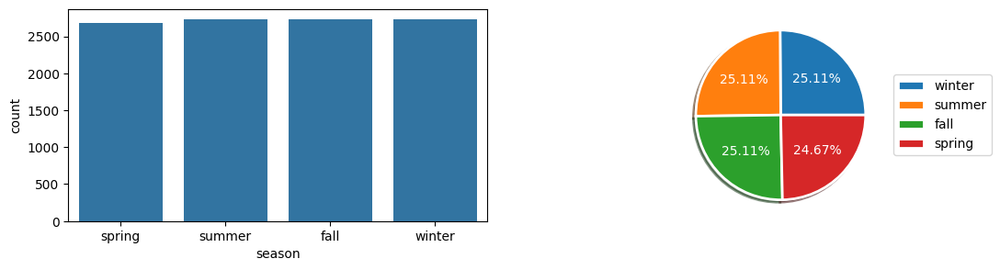

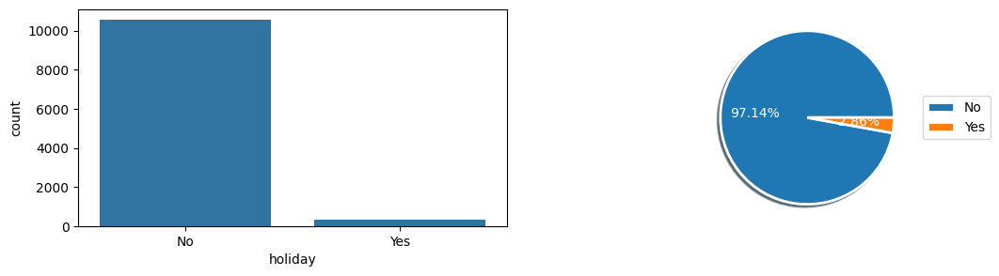

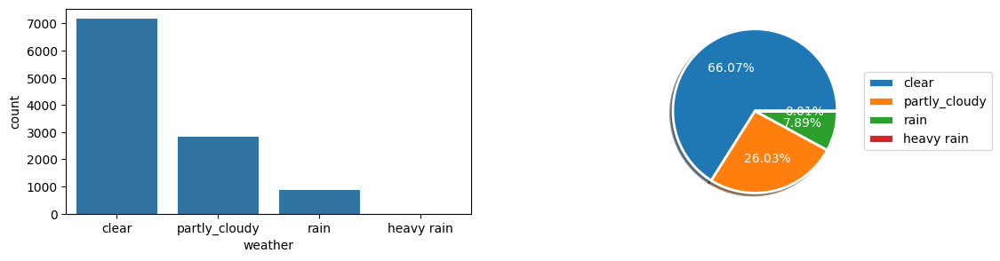

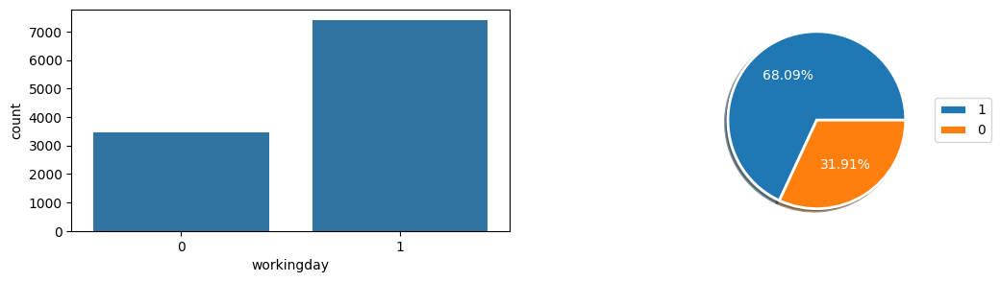

In [ ]:
columns = ['season','holiday','weather','workingday']
plt.style.use('default')
#plt.figure(figsize=(20,10))
for i in columns:
  plt.figure(figsize=(20,3))
  plt.subplot(1,3,1)
  sns.countplot(data=data,x=i)
  plt.subplot(1,3,2)
  plt.pie(data[i].value_counts(),labels=data[i].value_counts().index,autopct='%1.2f%%',shadow=True,wedgeprops={"edgecolor" : "white",'linewidth': 2, 'antialiased': True},textprops={'fontsize': 10,'color':'white'})
  plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [ ]:
columns = ['temp', 'atemp', 'humidity', 'windspeed', 'casual', 'registered','total_rentals']

<function matplotlib.pyplot.show(close=None, block=None)>

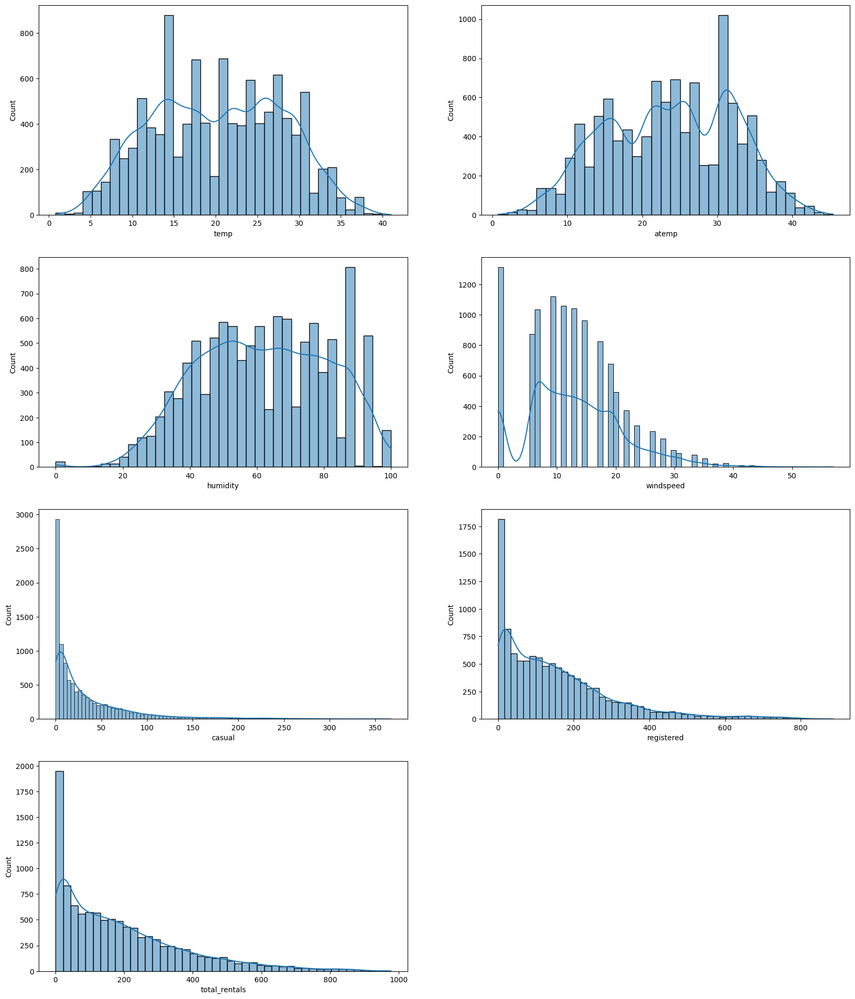

In [ ]:
plt.figure(figsize=(20,24))
for i in columns:
  plt.subplot(4,2,columns.index(i)+1)
  sns.histplot(data=data[i],kde=True)
plt.show

Insights

**Observations on distributions of Continous variables**
* We can see that the variables - Casual, Registered and Total_Rentals are skewed to the right.
* By looking at the distribution for windspeed, we can see that it follows a binomial distribution. Because there were days when there were 0 windspeed and on the other days there was low - moderate windspeed.
* The Temp, Atemp and Humidity follows (somewhat) a Normal distribution. Because most of their data points are centered around the mean however we will still try to test this hypothesis by using Shapiro.

### Bivariate Analysis

**Rentals as per Timeline**

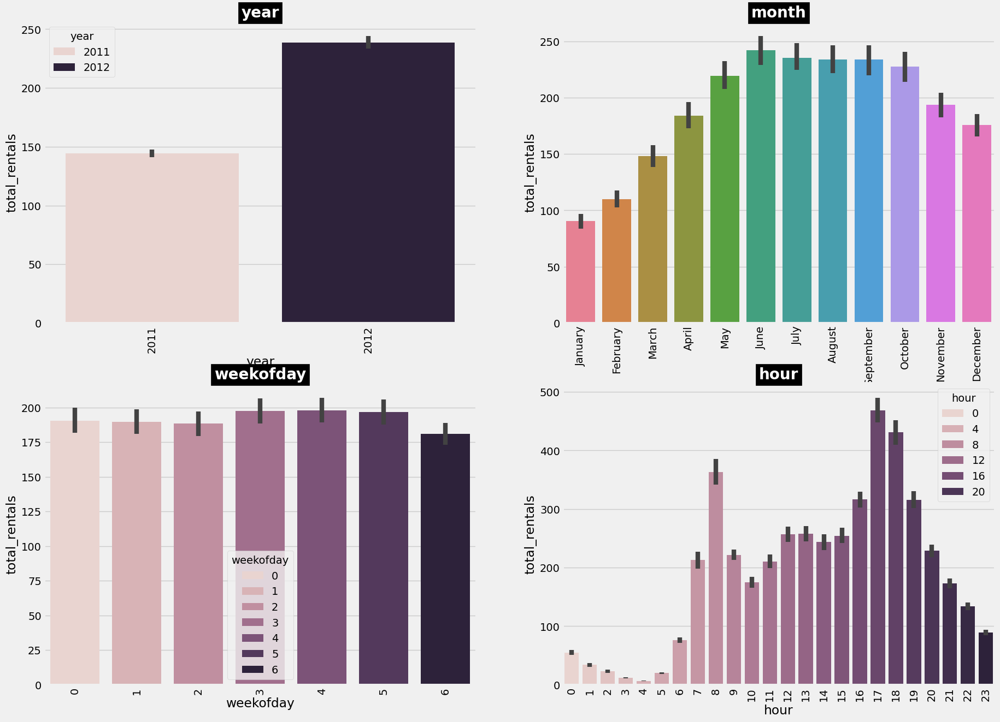

In [ ]:
plt.style.use('fivethirtyeight')
columns2 = ['year','month','weekofday','hour']
plt.figure(figsize=(20,15))
for i in columns2:
  plt.subplot(2,2,columns2.index(i)+1)
  plt.title(i,fontsize=20,fontweight='bold',backgroundcolor='black',color='white')
  sns.barplot(data=data,x=i,y='total_rentals',hue=i)
  plt.xticks(rotation=90)
plt.show()

In [ ]:
data

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,total_rentals,year,month,weekofday,hour
0,2011-01-01 00:00:00,spring,No,0,clear,9.84,14.395,81,0.0000,3,13,16,2011,January,5,0
1,2011-01-01 01:00:00,spring,No,0,clear,9.02,13.635,80,0.0000,8,32,40,2011,January,5,1
2,2011-01-01 02:00:00,spring,No,0,clear,9.02,13.635,80,0.0000,5,27,32,2011,January,5,2
3,2011-01-01 03:00:00,spring,No,0,clear,9.84,14.395,75,0.0000,3,10,13,2011,January,5,3
4,2011-01-01 04:00:00,spring,No,0,clear,9.84,14.395,75,0.0000,0,1,1,2011,January,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10881,2012-12-19 19:00:00,winter,No,1,clear,15.58,19.695,50,26.0027,7,329,336,2012,December,2,19
10882,2012-12-19 20:00:00,winter,No,1,clear,14.76,17.425,57,15.0013,10,231,241,2012,December,2,20
10883,2012-12-19 21:00:00,winter,No,1,clear,13.94,15.910,61,15.0013,4,164,168,2012,December,2,21
10884,2012-12-19 22:00:00,winter,No,1,clear,13.94,17.425,61,6.0032,12,117,129,2012,December,2,22


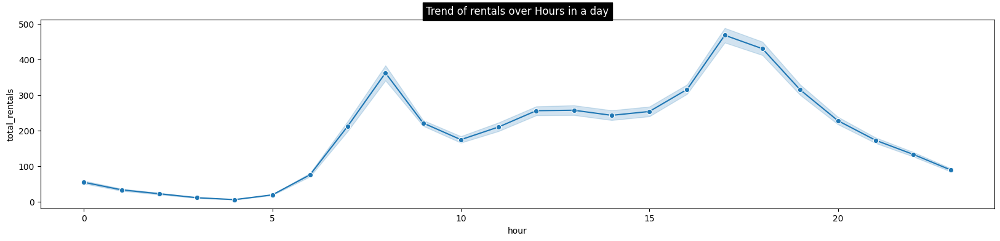

In [ ]:
plt.style.use('default')
plt.figure(figsize=(20,4))
sns.lineplot(x='hour',y='total_rentals',data=data,marker='o')
plt.title('Trend of rentals over Hours in a day',color='white',backgroundcolor='black')
plt.show()

In [ ]:
data['year_month'] = data['year'].astype(str) + '-' + data['month'].astype(str)

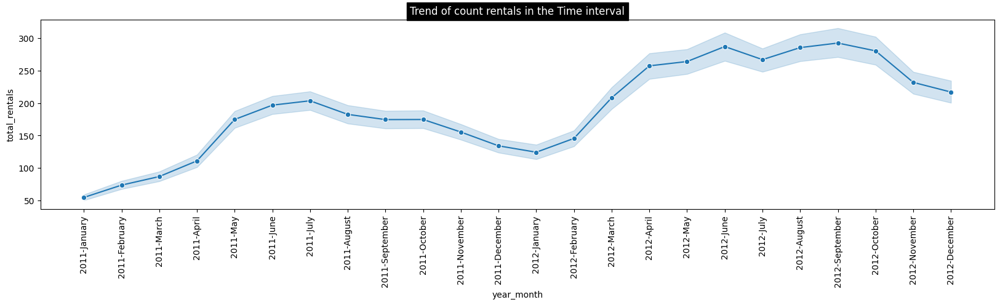

In [ ]:
plt.figure(figsize=(20,4))
sns.lineplot(x='year_month',y='total_rentals',data=data,marker='o')
plt.title('Trend of count rentals in the Time interval',color='white',backgroundcolor='black')
plt.xticks(rotation=90)
plt.show()

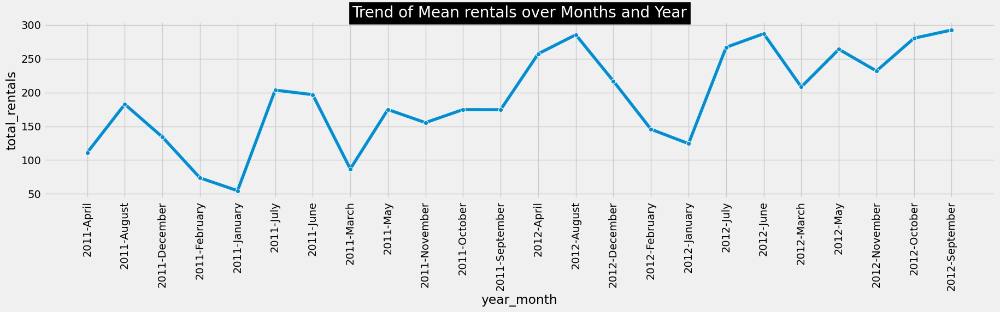

In [ ]:
plt.style.use('fivethirtyeight')
plt.figure(figsize=(20,4))
sns.lineplot(x='year_month',y='total_rentals',data=data.groupby(['year_month'])['total_rentals'].mean().reset_index(),marker='o')
plt.title('Trend of Mean rentals over Months and Year',color='white',backgroundcolor='black')
plt.xticks(rotation=90)
plt.show()

Insights:
- The Pattern from April 2011 to 2011 September looks Similar to 2012 April to 2012 September. It seems market is increasing on a same trend over the month.
- These patterns indicate that there is a distinct fluctuation in total_riders throughout the day, with low counts during early morning hours, a sudden increase in the morning, a peak count in the afternoon, and a gradual decline in the evening and nighttime.

- These patterns indicate that there is a distinct fluctuation in count throughout the month,yearwise but gradually increasing the count of total_riders

### Multivariate Analysis

In [ ]:
columns_cat= ['season', 'weather']
columns_num = ['holiday','workingday','year','month','weekofday','hour']
columns_cat

['season', 'weather']

In [ ]:
data.head()

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,total_rentals,year,month,weekofday,hour,year_month
0,2011-01-01 00:00:00,spring,No,0,clear,9.84,14.395,81,0.0,3,13,16,2011,January,5,0,2011-January
1,2011-01-01 01:00:00,spring,No,0,clear,9.02,13.635,80,0.0,8,32,40,2011,January,5,1,2011-January
2,2011-01-01 02:00:00,spring,No,0,clear,9.02,13.635,80,0.0,5,27,32,2011,January,5,2,2011-January
3,2011-01-01 03:00:00,spring,No,0,clear,9.84,14.395,75,0.0,3,10,13,2011,January,5,3,2011-January
4,2011-01-01 04:00:00,spring,No,0,clear,9.84,14.395,75,0.0,0,1,1,2011,January,5,4,2011-January


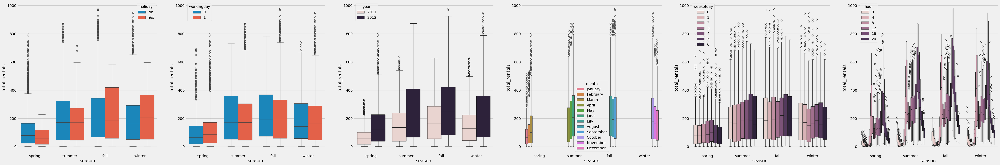

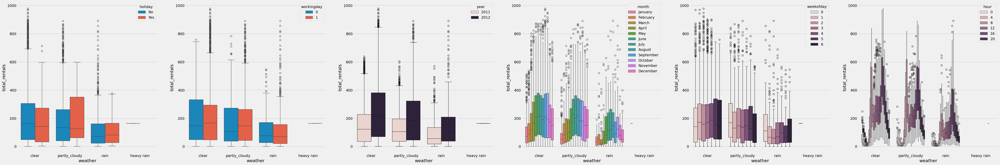

In [ ]:
plt.style.use('fivethirtyeight')
for i in columns_cat:
  plt.figure(figsize=(60,10))
  for j in columns_num:
    plt.subplot(1,6,columns_num.index(j)+1)
    sns.boxplot(data=data,x=i,y='total_rentals',hue=j)
  plt.show()

In [ ]:
data.select_dtypes(include=np.number).corr()

,temp,atemp,humidity,windspeed,casual,registered,total_rentals,year,weekofday,hour
temp,1.000000,0.984948,-0.064949,-0.017852,0.467097,0.318571,0.394454,0.061226,-0.038466,0.145430
atemp,0.984948,1.000000,-0.043536,-0.057473,0.462067,0.314635,0.389784,0.058540,-0.040235,0.140343
humidity,-0.064949,-0.043536,1.000000,-0.318607,-0.348187,-0.265458,-0.317371,-0.078606,-0.026507,-0.278011
windspeed,-0.017852,-0.057473,-0.318607,1.000000,0.092276,0.091052,0.101369,-0.015221,-0.024804,0.146631
casual,0.467097,0.462067,-0.348187,0.092276,1.000000,0.497250,0.690414,0.145241,0.246959,0.302045
registered,0.318571,0.314635,-0.265458,0.091052,0.497250,1.000000,0.970948,0.264265,-0.084427,0.380540
total_rentals,0.394454,0.389784,-0.317371,0.101369,0.690414,0.970948,1.000000,0.260403,-0.002283,0.400601
year,0.061226,0.058540,-0.078606,-0.015221,0.145241,0.264265,0.260403,1.000000,-0.003785,-0.004234
weekofday,-0.038466,-0.040235,-0.026507,-0.024804,0.246959,-0.084427,-0.002283,-0.003785,1.000000,-0.002925
hour,0.145430,0.140343,-0.278011,0.146631,0.302045,0.380540,0.400601,-0.004234,-0.002925,1.000000


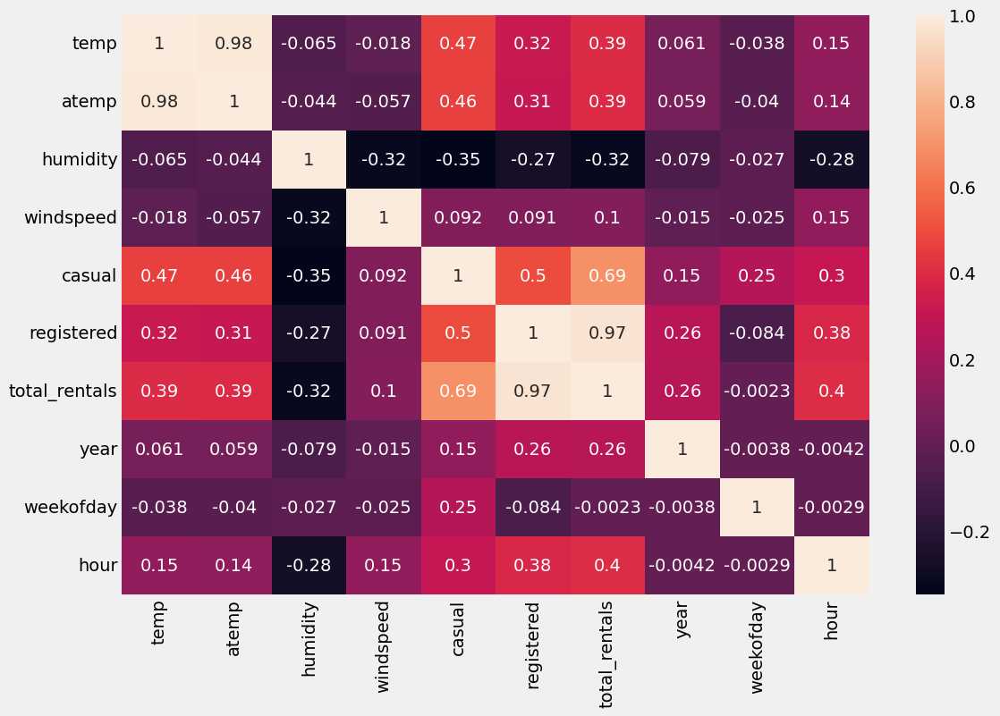

In [ ]:
plt.figure(figsize=(12,8))
sns.heatmap(data.select_dtypes(include=np.number).corr(),annot=True)
plt.show()

**Observations:**

Atemp:
* Strong positive correlation with 'temp' (0.98), indicating a close relationship.
* Moderate positive correlation with 'casual' (0.46) and 'registered' (0.31).
* Positive correlation with 'count' (0.39), suggesting a relationship with overall bike rentals.

Temp (Temperature):

* Highly correlated with 'atemp' (0.98), indicating a strong connection.
* Moderate positive correlation with 'casual' (0.47) and 'registered' (0.32).
* Positive correlation with 'count' (0.39), showing a relationship with overall bike rentals.

Humidity:

* Weak negative correlation with 'atemp' (-0.04) and 'temp' (-0.06).
* Moderate negative correlation with 'casual' (-0.35), 'registered' (-0.27), and 'count' (-0.32).
* Indicates a tendency for fewer bike rentals during higher humidity.

Windspeed:

* Weak negative correlation with 'atemp' (-0.06) and 'temp' (-0.02).
* Weak positive correlation with 'casual' (0.09), 'registered' (0.09), and 'count' (0.10).
* Suggests a subtle influence on bike rentals with increasing wind speed.

Casual (Casual Bike Rentals):

* Strong positive correlation with 'atemp' (0.46) and 'temp' (0.47).
* Moderate negative correlation with 'humidity' (-0.35) and positive correlation with 'windspeed' (0.09).
* Highly correlated with 'registered' (0.97) and 'count' (0.69), indicating a significant impact on overall rentals.

Registered (Registered Bike Rentals):

* Positive correlation with 'atemp' (0.31) and 'temp' (0.32).
* Negative correlation with 'humidity' (-0.27) and positive correlation with 'windspeed' (0.09).
* Highly correlated with 'casual' (0.50) and 'count' (0.97), emphasizing a substantial impact on overall rentals.

Total_Rentals (Total Bike Rentals):

* Positive correlation with 'atemp' (0.39), 'temp' (0.39), and 'casual' (0.69).
* Negative correlation with 'humidity' (-0.32).
* Highly correlated with 'registered' (0.97), emphasizing the joint impact of casual and registered rentals on the overall count.

<Figure size 6000x6000 with 0 Axes>

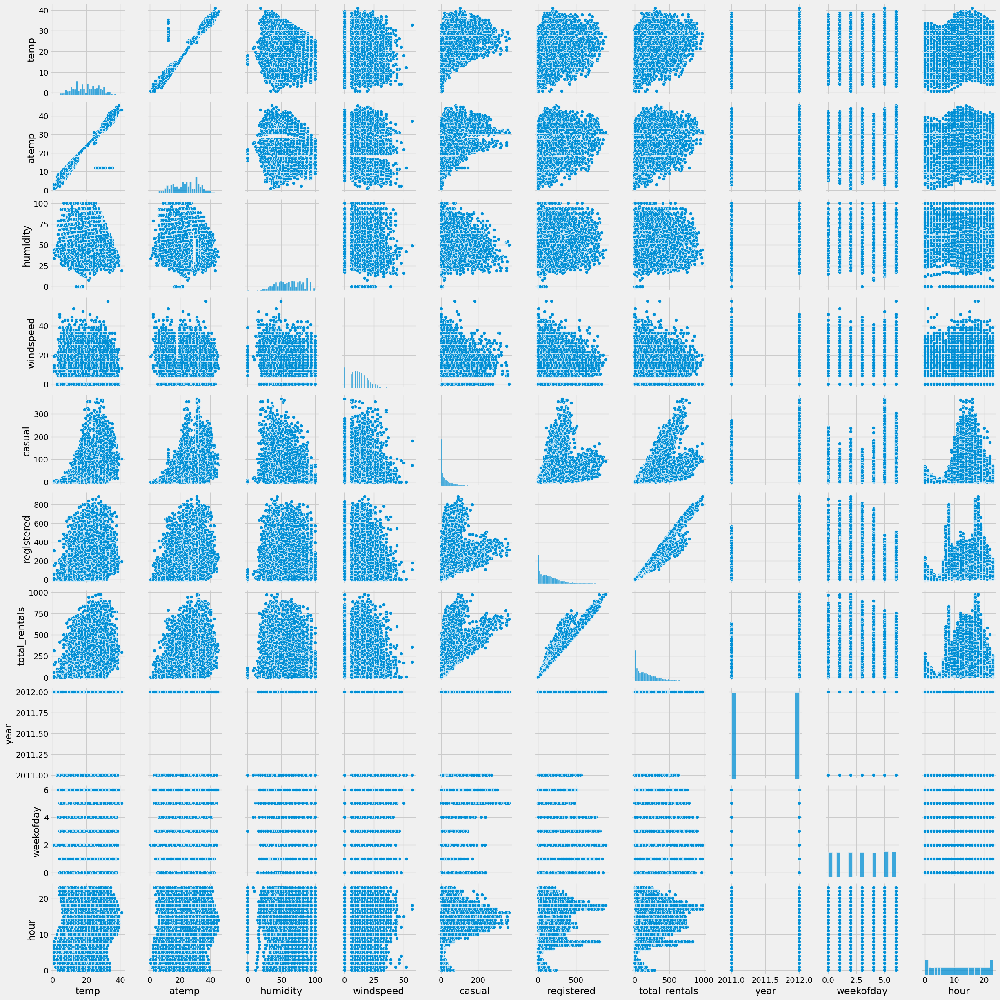

In [ ]:
plt.figure(figsize=(60,60))
sns.pairplot(data=data)
plt.show()

In [ ]:
cat_cols = ['season', 'holiday', 'workingday', 'weather']

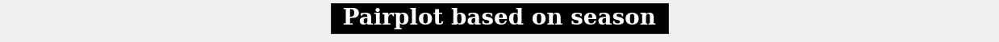

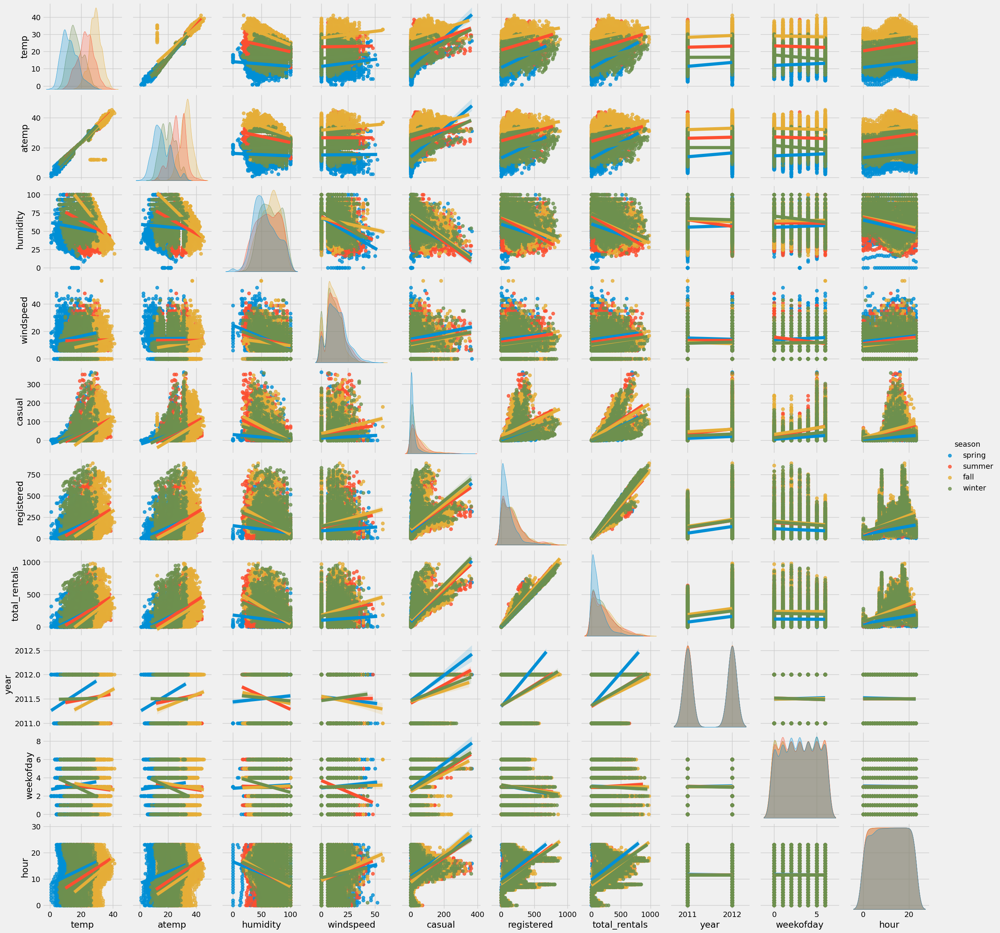

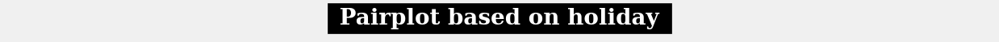

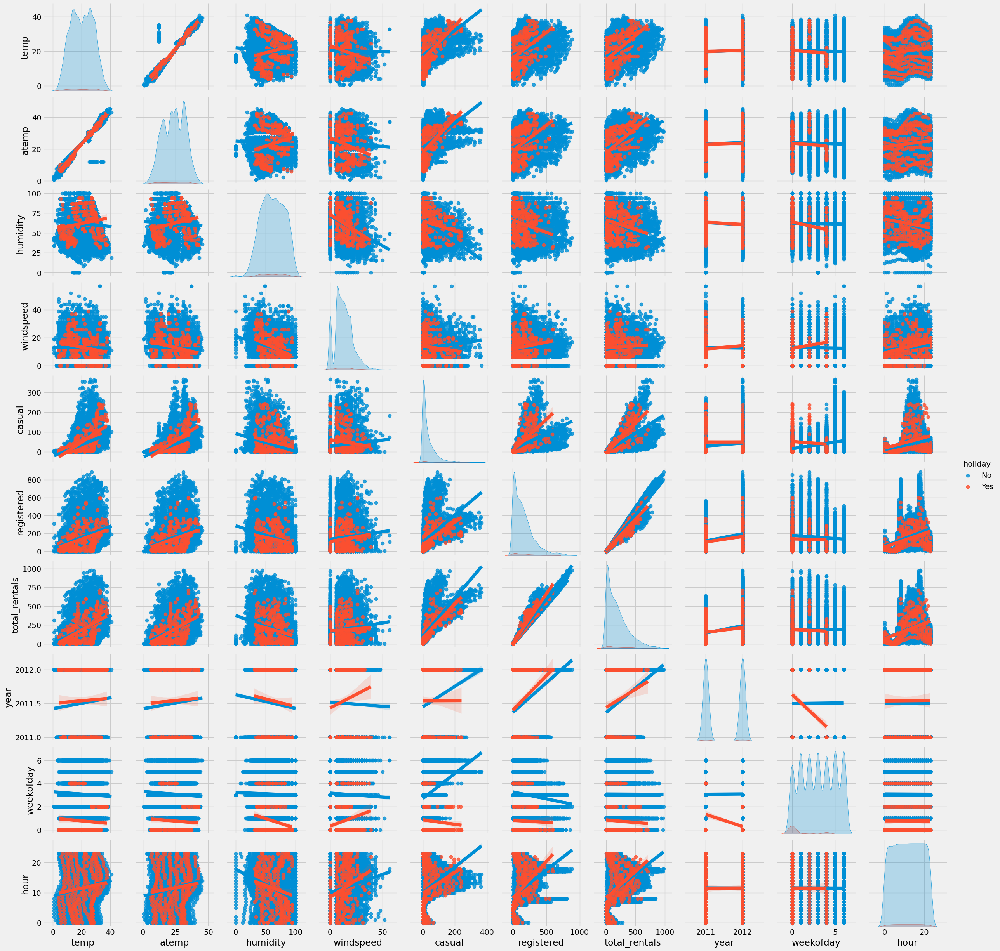

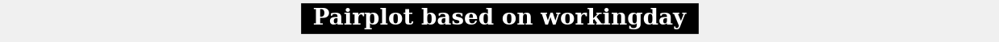

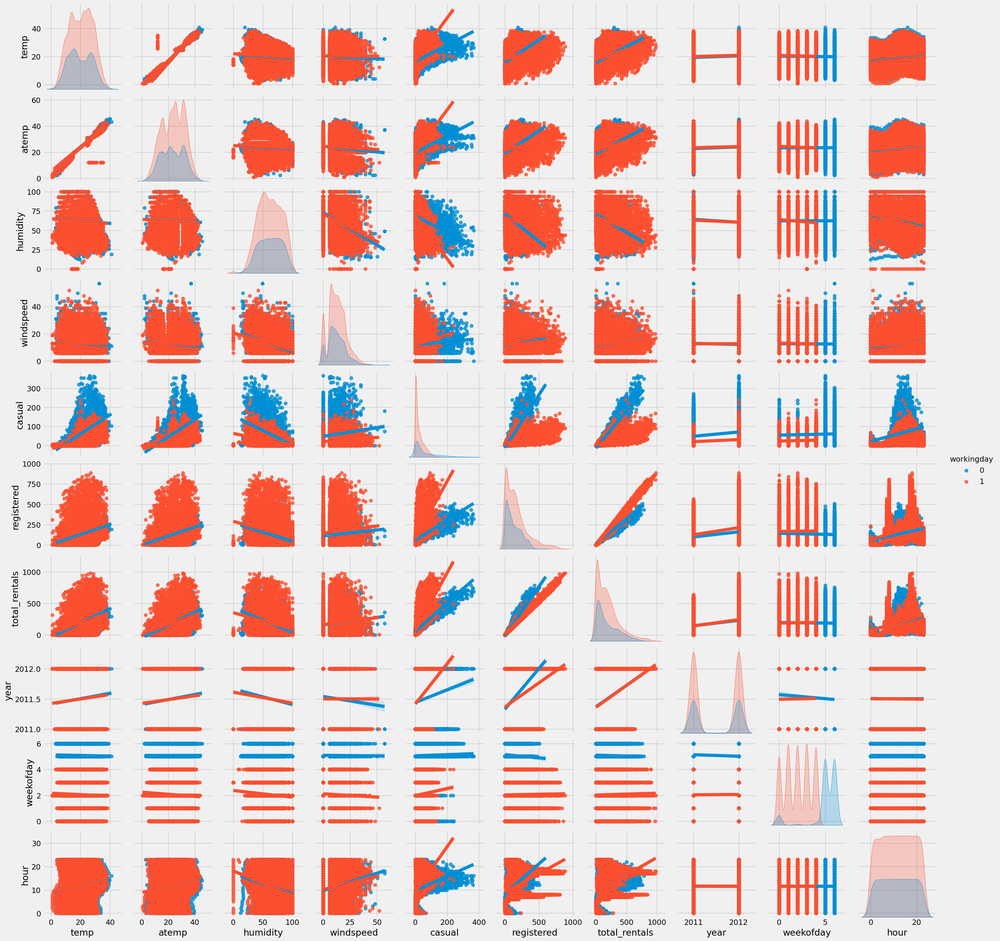

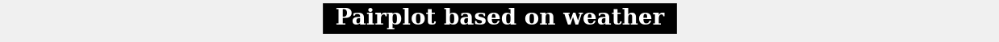

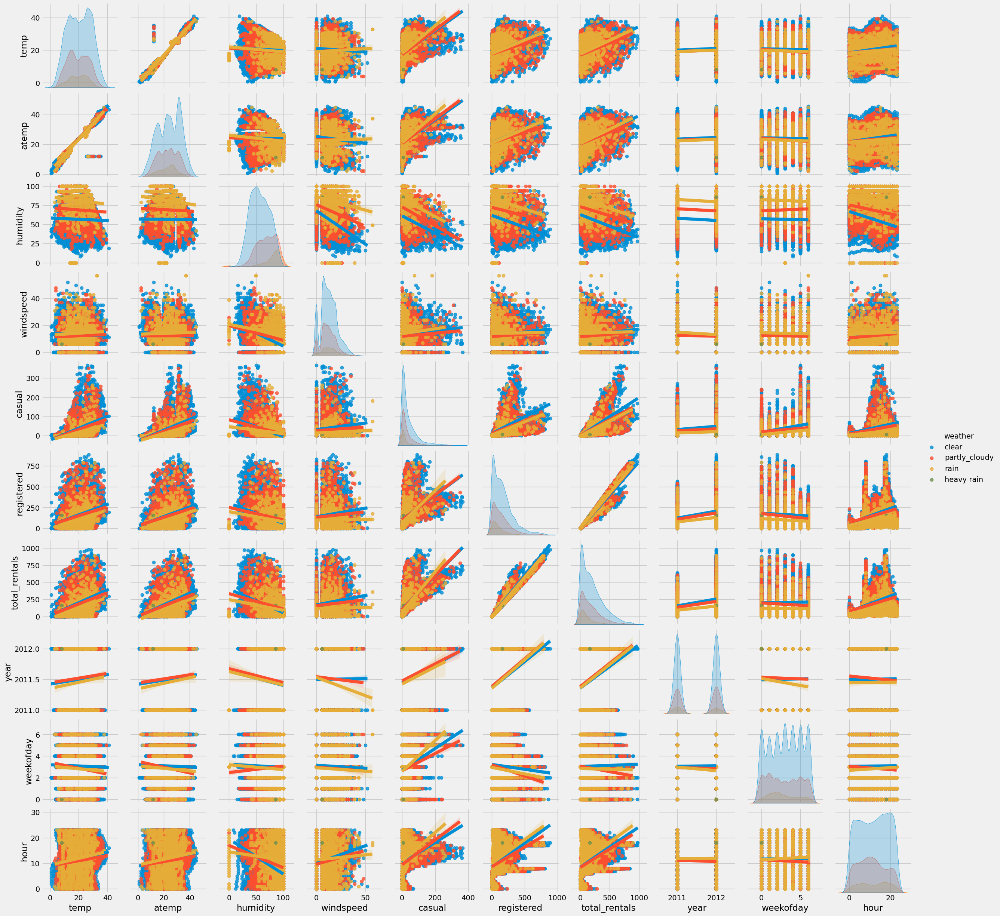

In [ ]:
for i in cat_cols:
    plt.figure(figsize=(14,0.05))
    plt.axis('off')
    plt.title(f' Pairplot based on {i} ',fontfamily='serif',fontweight='bold',fontsize=20,backgroundcolor='black',color='white')
    sns.pairplot(data,hue=i,kind='reg')
    plt.show()

**Observations:**
* We can conclude that registered users contribute more towards total_riders as there is a high correlation between them.
* We can also see high correlation between temp and atemp features.
* This scatterplot confirms that there is a high correlation between registered customers and total yulu bike riders.
* casual and registered are positively correlated.

# **Hypothesis Testing**

## *Hypothesis Testing FrameWork*

**Step-1: Setup Null and Alternate Hypothesis**

**Step-2: Check for basic Assumptions of the hypothesis**
* Normality check
 * Visual - QQplot/probplot and histplot
 * statistical - shapiro-wilk test
* Variance Check
 * Visual - kdeplot
 * statistical - levene's test

**Step-3: Define Test Statistics, Distribution under H0**

 * We know that the test statistic while performing a T-Test follows Tdistribution, Chi-square distribution for Chi-square test for independence and F-Distribution for both One-way and Two-Way Anova.

 * If data doesnot follows normal distribution we go with
  *  T-test alternative: Mannwhitney_u test (Non - Parametric test)
  * One-way Anova Alternative: KS-Test

**Step-4: Decide the kind of test.**
 * We will be performing Two tailed test for indpependent variables

**STEP-5: Compute the p-value and fix value of alpha.**
 * We set our alpha to be 0.05 (i.e) confidence level = 95%

**STEP-6: Compare p-value and alpha.**

* Based on p-value, we will accept or reject H0.
 * p-val > alpha : Accept Ho
 * p-val < alpha : Reject Ho

In [ ]:
from scipy.stats import shapiro

## *Normality Test for all Columns*

In [ ]:
for i in columns:
  print()
  test_statistic, p_value = shapiro(data[i])
  print(f'Normality Testing for {i} :')
  print("-"*30)

  print(f"The test-statistic for {i} is {test_statistic} with p_value {p_value}")

  if p_value > 0.05:
       print("Hence at 95% confidence level, we fail to reject null hypothesis")
       print(f"Hence we can say that {i} is normally distributed population")

  else:
       print("Hence at 95% confidence level, we reject null hypothesis")
       print(f"Hence we can say that {i} is not normally distributed population")

  print()
  print("-"*100)


Normality Testing for temp :
------------------------------
The test-statistic for temp is 0.9804052990118979 with p_value 4.4416921644612106e-36
Hence at 95% confidence level, we reject null hypothesis
Hence we can say that temp is not normally distributed population

----------------------------------------------------------------------------------------------------

Normality Testing for atemp :
------------------------------
The test-statistic for atemp is 0.9815304574471947 with p_value 3.220898326923054e-35
Hence at 95% confidence level, we reject null hypothesis
Hence we can say that atemp is not normally distributed population

----------------------------------------------------------------------------------------------------

Normality Testing for humidity :
------------------------------
The test-statistic for humidity is 0.982258701470504 with p_value 1.2220289155107286e-34
Hence at 95% confidence level, we reject null hypothesis
Hence we can say that humidity is not norma

## *2- Sample T-Test to check if Working Day has an effect on the number of electric cycles rented*

In [ ]:
data['workingday'].unique()

[0, 1]
Categories (2, int64): [0, 1]

As there are only two types of categories in workingDay, it is most preferred to use Two Sample T-Test.

Assumption of Two Sample T-Test
* Both samples are independent.
* Both populations are normally distributed.
* The population variances are equal (use Levene’s test to check homogeneity of variance).
* Samples are randomly selected.

In [ ]:
from scipy.stats import ttest_1samp,ttest_ind

Lets check for the assumption whether followed or not?

### 1. Normality Test

In [ ]:
from scipy.stats import kruskal,shapiro,levene
from statsmodels.api import qqplot

#### Visual Check by QQPlot

In [ ]:
np.random.seed(101)
workingDay_Sample = data[data['workingday']==1].sample(1500)
nonWorkingDay_Sample = data[data['workingday']==0].sample(1500)

<Figure size 1500x800 with 0 Axes>

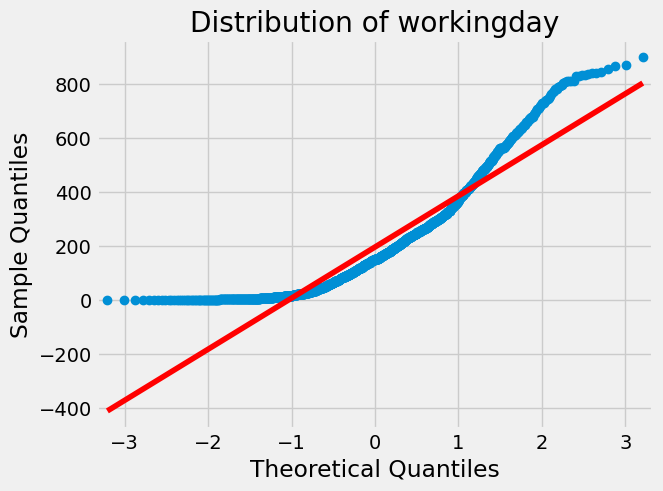

In [ ]:
plt.figure(figsize=(15,8))
qqplot(workingDay_Sample['total_rentals'],line='s')
plt.title('Distribution of workingday')
plt.show()

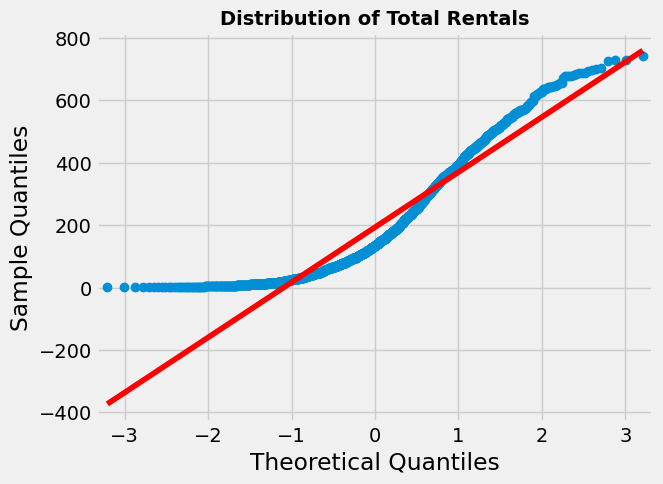

In [ ]:
qqplot(nonWorkingDay_Sample['total_rentals'],line='s')
plt.title('Distribution of Total Rentals',{'fontsize':14,'weight':'bold'})
plt.show()

* On a Visual Check, it describes that Total_Rentals on WorkingDay and nonWorkingDay does follow normal distribution a little bit.

#### Statistical Check by Shapiro-Wilk Test

In [ ]:
print("H0: Data is Normally Distributed")
print("H1: Data is Not Normally Distributed")
print("*"*50)
print('Shapiro test for Total Rentals on workingday')
print("*"*50)
test_statistic, p_value = shapiro(workingDay_Sample['total_rentals'])
print(f"The test-statistic for workingday is {test_statistic} with p_value {p_value}")
if(p_value < 0.05):
  print("Hence at morethan 95% confidence level, we reject null hypothesis")
  print("Hence we can say that Total Rentals workingday is not normally distributed population")
else:
  print("Hence at lessthan 95% confidence level, we fail to reject null hypothesis")
  print("Hence we can say that Total Rentals workingday is normally distributed population")

H0: Data is Normally Distributed
H1: Data is Not Normally Distributed
**************************************************
Shapiro test for Total Rentals on workingday
**************************************************
The test-statistic for workingday is 0.8694891465563627 with p_value 1.2513454044334014e-33
Hence at morethan 95% confidence level, we reject null hypothesis
Hence we can say that Total Rentals workingday is not normally distributed population


In [ ]:
print("H0: Data is Normally Distributed")
print("H1: Data is Not Normally Distributed")
print("*"*50)
print('Shapiro test for Total Rentals on Non workingday')
print("*"*50)
test_statistic, p_value = shapiro(nonWorkingDay_Sample['total_rentals'])
print(f"The test-statistic for workingday is {test_statistic} with p_value {p_value}")
if(p_value < 0.05):
  print("Hence at morethan 95% confidence level, we reject null hypothesis")
  print("Hence we can say that Total Rentals Non workingday is not normally distributed population")
else:
  print("Hence at lessthan 95% confidence level, we fail to reject null hypothesis")
  print("Hence we can say that Total Rentals Non workingday is normally distributed population")

H0: Data is Normally Distributed
H1: Data is Not Normally Distributed
**************************************************
Shapiro test for Total Rentals on Non workingday
**************************************************
The test-statistic for workingday is 0.8858812694310416 with p_value 7.067651181136081e-32
Hence at morethan 95% confidence level, we reject null hypothesis
Hence we can say that Total Rentals Non workingday is not normally distributed population


* Theoretically, it says that both the columns does not follow Normal Distribution

### 2. Variance Check

#### Visual Check

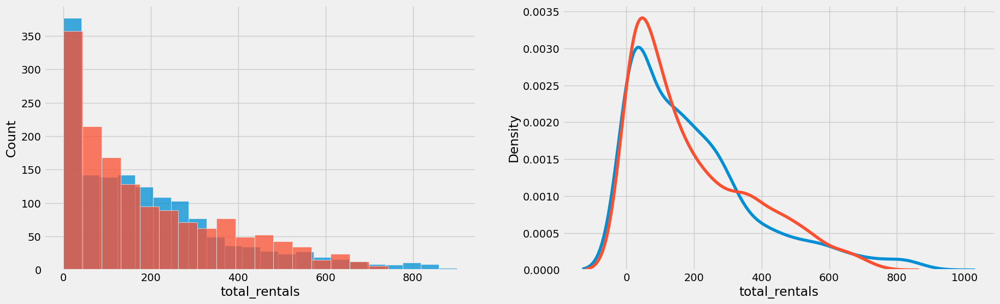

In [ ]:
plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
sns.histplot(workingDay_Sample['total_rentals'])
sns.histplot(nonWorkingDay_Sample['total_rentals'])
plt.subplot(1,2,2)
sns.kdeplot(workingDay_Sample['total_rentals'])
sns.kdeplot(nonWorkingDay_Sample['total_rentals'])
plt.show()

* By Visual check we can say that the variance is similar among both

#### Statistical Check

In [ ]:
print('H0: Both the variances are equal')
print('H1: Both the variances are not equal')
print("*"*50)
print('Levene test for Total Rentals on workingday and nonWorkingDay')
print("*"*50)
test_statistic, p_value = levene(workingDay_Sample['total_rentals'],nonWorkingDay_Sample['total_rentals'])
print(f"The test-statistic for workingday and total_rentals is {test_statistic} with p_value {p_value}")
if(p_value < 0.05):
  print("Hence at morethan 95% confidence level, we reject null hypothesis")
  print("Hence we can say that both the variances are not equal")
  print("Hence we can say that Total Rentals on workingday and nonWorkingDay are not normally distributed population")
else:
  print("Hence at lessthan 95% confidence level, we fail to reject null hypothesis")
  print("Hence we can say that both the variances are equal")
  print("Hence we can say that Total Rentals on workingday and nonWorkingDay are normally distributed population")


H0: Both the variances are equal
H1: Both the variances are not equal
**************************************************
Levene test for Total Rentals on workingday and nonWorkingDay
**************************************************
The test-statistic for workingday and total_rentals is 0.3328269489902554 with p_value 0.564042515142372
Hence at lessthan 95% confidence level, we fail to reject null hypothesis
Hence we can say that both the variances are equal
Hence we can say that Total Rentals on workingday and nonWorkingDay are normally distributed population


* 2 of the assumptions does not satisfy the Two sample T-Test assumptions.

Since the samples are not normally distributed, T-Test cannot be applied here, we can perform its non parametric equivalent test i.e., `Mann-Whitney U rank test` for two independent samples. But we will try to compare both tests.

### Two sample T-Test

In [ ]:
print("H0: Both the means are equal")
print("H1: Both the means are not equal")
print("*"*50)
print("Two sample T-Test for Total Rentals on workingday and nonWorkingDay")
print("*"*50)
test_stat,p_value = ttest_ind(workingDay_Sample['total_rentals'],nonWorkingDay_Sample['total_rentals'])
print(f"The test-statistic for workingday and total_rentals is {test_statistic} with p_value {p_value}")
if(p_value < 0.05):
  print("Hence at morethan 95% confidence level, we reject null hypothesis")
  print("Hence it is significant enough to say both the means are not equal.")
else:
  print("Hence at lessthan 95% confidence level, we fail to reject null hypothesis")
  print("Hence we can say that both the means are equal")

H0: Both the means are equal
H1: Both the means are not equal
**************************************************
Two sample T-Test for Total Rentals on workingday and nonWorkingDay
**************************************************
The test-statistic for workingday and total_rentals is 0.3328269489902554 with p_value 0.566724427919753
Hence at lessthan 95% confidence level, we fail to reject null hypothesis
Hence we can say that both the means are equal


**As data does not provide strong evidence of a total rentals difference on working day and non working day, hence we conclude that workingday does not show effect on total rentals.**

### Manwhitneyu Test

In [ ]:
from scipy.stats import mannwhitneyu

In [ ]:
# Test statistics : Mann-Whitney U rank test for two independent samples
print("-"*100)
print("Mannwhitneyu test on working and non working days effect on total rentals.")
test_stat, p_value = mannwhitneyu(workingDay_Sample['total_rentals'],nonWorkingDay_Sample['total_rentals'])
print("*"*50)
print(f'Mannwhitneyu_stat : ',test_stat)
print('P-value :',p_value," for Mannwhitneyu test on relation between working day and non working day on total rentals.")

if p_value < 0.05:
    print("Reject Null Hypothesis")
    print('No.of bikes rented is not same for working and non-working days')
else:
    print("Failed to Reject Null Hypothesis - Accept Ho")
    print('No.of bikes rented is same for working and non-working days')
print("-"*100)

----------------------------------------------------------------------------------------------------
Mannwhitneyu test on working and non working days effect on total rentals.
**************************************************
Mannwhitneyu_stat :  1116892.0
P-value : 0.7325101175030377  for Mannwhitneyu test on relation between working day and non working day on total rentals.
Failed to Reject Null Hypothesis - Accept Ho
No.of bikes rented is same for working and non-working days
----------------------------------------------------------------------------------------------------


## *ANOVA to check if No. of cycles rented is similar or different in different weather*

In [ ]:
#data['season'] = data['season'].map({1: 'spring', 2: 'summer', 3: 'fall', 4: 'winter'})
#data['weather'] = data['weather'].map({'clear':1, 'partly_cloudy':2, 'rain':3, 'heavy rain':4})
data

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,total_rentals,year,month,weekofday,hour,year_month
0,2011-01-01 00:00:00,spring,No,0,clear,9.84,14.395,81,0.0000,3,13,16,2011,January,5,0,2011-January
1,2011-01-01 01:00:00,spring,No,0,clear,9.02,13.635,80,0.0000,8,32,40,2011,January,5,1,2011-January
2,2011-01-01 02:00:00,spring,No,0,clear,9.02,13.635,80,0.0000,5,27,32,2011,January,5,2,2011-January
3,2011-01-01 03:00:00,spring,No,0,clear,9.84,14.395,75,0.0000,3,10,13,2011,January,5,3,2011-January
4,2011-01-01 04:00:00,spring,No,0,clear,9.84,14.395,75,0.0000,0,1,1,2011,January,5,4,2011-January
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10881,2012-12-19 19:00:00,winter,No,1,clear,15.58,19.695,50,26.0027,7,329,336,2012,December,2,19,2012-December
10882,2012-12-19 20:00:00,winter,No,1,clear,14.76,17.425,57,15.0013,10,231,241,2012,December,2,20,2012-December
10883,2012-12-19 21:00:00,winter,No,1,clear,13.94,15.910,61,15.0013,4,164,168,2012,December,2,21,2012-December
10884,2012-12-19 22:00:00,winter,No,1,clear,13.94,17.425,61,6.0032,12,117,129,2012,December,2,22,2012-December


In [ ]:
data['season'].value_counts()

,count
season,
winter,2734
summer,2733
fall,2733
spring,2686


In [ ]:
data['weather'].unique()

['clear', 'partly_cloudy', 'rain', 'heavy rain']
Categories (4, object): ['clear', 'partly_cloudy', 'rain', 'heavy rain']

In [ ]:
data['weather'].value_counts()

,count
weather,
clear,7192
partly_cloudy,2834
rain,859
heavy rain,1


As there is no data on weather heavy rain, only on weather clear,party_cloud,rain the anova check will be done.

As there are 4 types of categories in weather, it is predominant to use one-way Anova

Assumptions of one-way Anova:
* The dependent variable is continuous.
* The independent variable is categorical with 2+ groups.
* The data in each group is normally distributed.
* Homogeneity of variances (variances in each group are approximately equal).
* Observations are independent.

In [ ]:
weather1 = data[data['weather']=='clear']
weather2 = data[data['weather']=='partly_cloudy']
weather3 = data[data['weather']=='rain']

### 1. Normality Test

#### Visual Check by plots

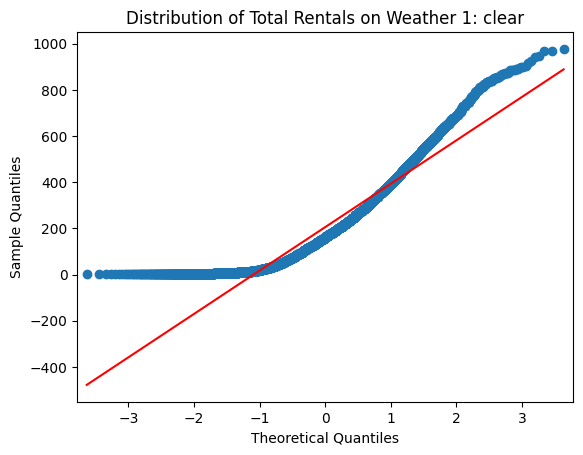

In [ ]:
plt.style.use('default')
qqplot(weather1['total_rentals'],line='s')
plt.title('Distribution of Total Rentals on Weather 1: clear')
plt.show()

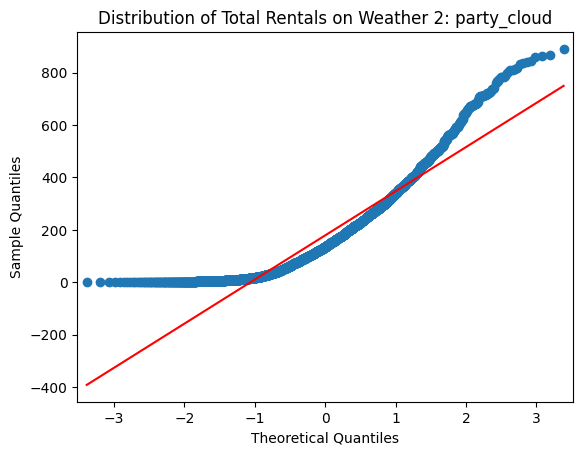

In [ ]:
qqplot(weather2['total_rentals'],line='s')
plt.title('Distribution of Total Rentals on Weather 2: party_cloud')
plt.show()

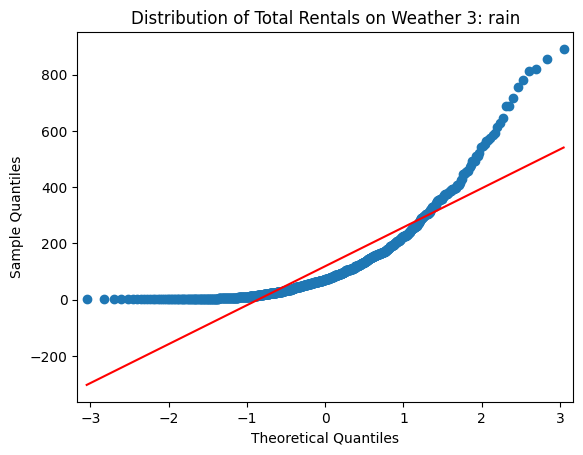

In [ ]:
qqplot(weather3['total_rentals'],line='s')
plt.title('Distribution of Total Rentals on Weather 3: rain')
plt.show()

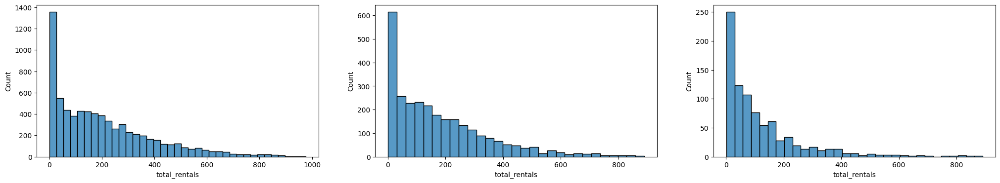

In [ ]:
plt.figure(figsize=(25,4))
plt.subplot(1,3,1)
sns.histplot(data=weather1,x='total_rentals')
plt.subplot(1,3,2)
sns.histplot(data=weather2,x='total_rentals')
plt.subplot(1,3,3)
sns.histplot(data=weather3,x='total_rentals')
plt.show()

By Visual Check it seems like all the data as per weather seems to follow normal distribution a little bit.

#### Statistical Check

In [ ]:
def shapiro_test(data,col):
 print("H0: Data is Normally Distributed")
 print("H1: Data is Not Normally Distributed")
 print("*"*50)
 test_stats,p_value = shapiro(data[col])
 print(f"The test-statistic for {col} is {test_statistic} with p_value {p_value}")
 if(p_value < 0.05):
   print("Hence at morethan 95% confidence level, we reject null hypothesis")
   print(f"Hence we can say that Total Rentals {col} is not normally distributed population")
 else:
   print("Hence at lessthan 95% confidence level, we fail to reject null hypothesis")
   print(f"Hence we can say that Total Rentals {col} is normally distributed population")

In [ ]:
print("-"*100)
print(f'Shapiro test for total_rentals on weather1')
print("*"*50)
shapiro_test(weather1,'total_rentals')
print("-"*100)
print(f'Shapiro test for total_rentals on weather2')
print("*"*50)
shapiro_test(weather2,'total_rentals')
print("-"*100)
print(f'Shapiro test for total_rentals on weather3')
print("*"*50)
shapiro_test(weather3,'total_rentals')
print("-"*100)

----------------------------------------------------------------------------------------------------
Shapiro test for total_rentals on weather1
**************************************************
H0: Data is Normally Distributed
H1: Data is Not Normally Distributed
**************************************************
The test-statistic for total_rentals is 0.3328269489902554 with p_value 1.5964921477006555e-57
Hence at morethan 95% confidence level, we reject null hypothesis
Hence we can say that Total Rentals total_rentals is not normally distributed population
----------------------------------------------------------------------------------------------------
Shapiro test for total_rentals on weather2
**************************************************
H0: Data is Normally Distributed
H1: Data is Not Normally Distributed
**************************************************
The test-statistic for total_rentals is 0.3328269489902554 with p_value 9.777839106111785e-43
Hence at morethan 95% co

By statistical analysis, we can say that none of the weather do follow normal distributions.

### 2. Variance

#### Visual Check by plots

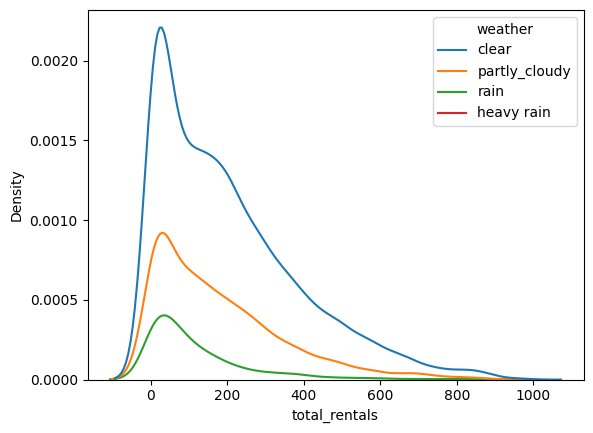

In [ ]:
sns.kdeplot(data=data,x='total_rentals',hue='weather')
plt.show()

It seems all the weather data follows similar variance.

#### Statistical Check

In [ ]:
print('H0: Both the variances are equal')
print('H1: Both the variances are not equal')
print("*"*50)
print('Levene test for Total Rentals on different weathers')
print("*"*50)
test_statistic, p_value = levene(weather1['total_rentals'],weather2['total_rentals'],weather3['total_rentals'])
print(f"The test-statistic for workingday and total_rentals is {test_statistic} with p_value {p_value}")
if(p_value < 0.05):
  print("Hence at morethan 95% confidence level, we reject null hypothesis")
  print("Hence we can say that both the variances are not equal")
  print("Hence we can say that Total Rentals on different weather are not normally distributed population")
else:
  print("Hence at lessthan 95% confidence level, we fail to reject null hypothesis")
  print("Hence we can say that both the variances are equal")
  print("Hence we can say that Total Rentals on different weathers are normally distributed population")


H0: Both the variances are equal
H1: Both the variances are not equal
**************************************************
Levene test for Total Rentals on different weathers
**************************************************
The test-statistic for workingday and total_rentals is 81.67574924435011 with p_value 6.198278710731511e-36
Hence at morethan 95% confidence level, we reject null hypothesis
Hence we can say that both the variances are not equal
Hence we can say that Total Rentals on different weather are not normally distributed population


* **Hence the p_values is smaller than the significance level, Null hypothesis can be rejected.**

* **Therefore, the variances are not equal.**

* **Two of the three conditions of ANOVA are not met, We will still perform ANOVA.**

* **Then We will also perform Kruskal's test and compare the results.**

* **In case of any discrepancies, Kruskal's test results will be considered, since data does not met conditions of ANOVA.**

### One-Way Anova

In [ ]:
from scipy.stats import f_oneway

In [ ]:
print("-"*100)
print("Ho: There is no significant difference between demand of bicycles for different Weather conditions.")
print("Ha: There is a significant difference between demand of bicycles for different Weather conditions.")
print("*"*50)
print("One-way Anova Test on demand of electric bicycles on different weather conditions")
print("*"*50)
f_stat,p_value = f_oneway(weather1['total_rentals'],weather2['total_rentals'],weather3['total_rentals'])
print(f"The f-statistic for different weather and total_rentals is {test_statistic} with p_value {p_value}")
if(p_value < 0.05):
  print("Hence at morethan 95% confidence level, we reject null hypothesis")
  print("Hence it is significant enough to say there is a significant difference between demand of bicycles for different Weather conditions.")
else:
  print("Hence at lessthan 95% confidence level, we fail to reject null hypothesis")
  print("Hence we can say that there is no significant difference between demand of bicycles for different Weather conditions.")
print("-"*100)

----------------------------------------------------------------------------------------------------
Ho: There is no significant difference between demand of bicycles for different Weather conditions.
Ha: There is a significant difference between demand of bicycles for different Weather conditions.
**************************************************
One-way Anova Test on demand of electric bicycles on different weather conditions
**************************************************
The f-statistic for different weather and total_rentals is 81.67574924435011 with p_value 4.976448509904196e-43
Hence at morethan 95% confidence level, we reject null hypothesis
Hence it is significant enough to say there is a significant difference between demand of bicycles for different Weather conditions.
----------------------------------------------------------------------------------------------------


### kruskalWallis test

In [ ]:
from scipy.stats import kruskal

In [ ]:
print("-"*100)
print("H0: All the medians of total rents are same in different conditions")
print("H0: All the medians of total rents are different in different conditions")
print("*"*50)
print("Kruskal-Wallis Test on demand of electric bicycles on different weather conditions")
print("*"*50)
test_stat,p_value = kruskal(weather1['total_rentals'],weather2['total_rentals'],weather3['total_rentals'])
print(f"The test-statistic for different weather and total_rentals is {test_statistic} with p_value {p_value}")
if(p_value < 0.05):
  print("Hence at morethan 95% confidence level, we reject null hypothesis")
  print("Hence it is significant enough to say there is a significant difference between demand of bicycles for different Weather conditions.")
else:
  print("Hence at lessthan 95% confidence level, we fail to reject null hypothesis")
  print("Hence we can say that there is no significant difference between demand of bicycles for different Weather conditions.")
print("-"*100)

----------------------------------------------------------------------------------------------------
H0: All the medians of total rents are same in different conditions
H0: All the medians of total rents are different in different conditions
**************************************************
Kruskal-Wallis Test on demand of electric bicycles on different weather conditions
**************************************************
The test-statistic for different weather and total_rentals is 81.67574924435011 with p_value 3.122066178659941e-45
Hence at morethan 95% confidence level, we reject null hypothesis
Hence it is significant enough to say there is a significant difference between demand of bicycles for different Weather conditions.
----------------------------------------------------------------------------------------------------


**Therefore, It clearly says that different weather conditions attract the customers in a different demand for rentals.**

## *ANOVA to check if No. of cycles rented is similar or different in different season*

In [ ]:
data['season'].unique()

['spring', 'summer', 'fall', 'winter']
Categories (4, object): ['spring', 'summer', 'fall', 'winter']

In [ ]:
data['season'].value_counts()

,count
season,
winter,2734
summer,2733
fall,2733
spring,2686


As there are 4 types of categories in season, it is predominant to use one-way Anova

Assumptions of one-way Anova:
* The dependent variable is continuous.
* The independent variable is categorical with 2+ groups.
* The data in each group is normally distributed.
* Homogeneity of variances (variances in each group are approximately equal).
* Observations are independent.

In [ ]:
season1 = data[data['season']=='winter']
season2 = data[data['season']=='summer']
season3 = data[data['season']=='fall']
season4 = data[data['season']=='spring']

### 1. Normality Test

#### Visual Check by plots

In [ ]:
from scipy.stats import probplot

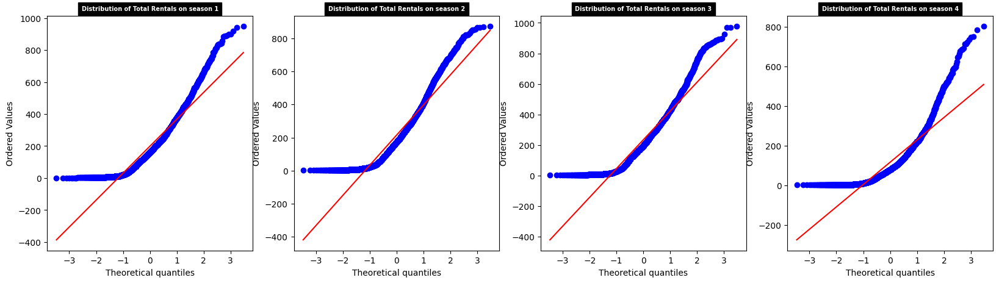

In [ ]:
plt.figure(figsize=(20,5))
plt.subplot(1,4,1)
probplot(season1['total_rentals'],plot=plt,dist='norm')
plt.title('Distribution of Total Rentals on season 1',fontsize=7,fontweight="bold",backgroundcolor='black',color='w')
plt.subplot(1,4,2)
probplot(season2['total_rentals'],plot=plt,dist='norm')
plt.title('Distribution of Total Rentals on season 2',fontsize=7,fontweight="bold",backgroundcolor='black',color='w')
plt.subplot(1,4,3)
probplot(season3['total_rentals'],plot=plt,dist='norm')
plt.title('Distribution of Total Rentals on season 3',fontsize=7,fontweight="bold",backgroundcolor='black',color='w')
plt.subplot(1,4,4)
probplot(season4['total_rentals'],plot=plt,dist='norm')
plt.title('Distribution of Total Rentals on season 4',fontsize=7,fontweight="bold",backgroundcolor='black',color='w')
plt.show()

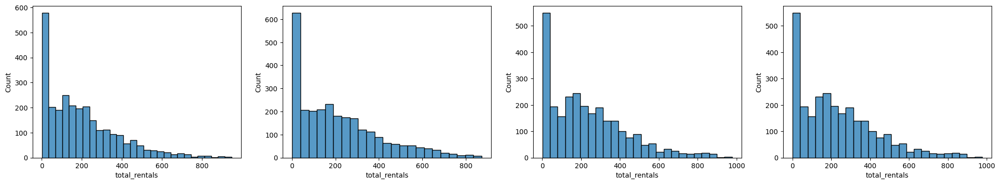

In [ ]:
plt.figure(figsize=(25,4))
plt.subplot(1,4,1)
sns.histplot(data=season1,x='total_rentals')
plt.subplot(1,4,2)
sns.histplot(data=season2,x='total_rentals')
plt.subplot(1,4,3)
sns.histplot(data=season3,x='total_rentals')
plt.subplot(1,4,4)
sns.histplot(data=season3,x='total_rentals')
plt.show()

By Visual Check it seems like all the data as per season seems to follow normal distribution a little bit.

#### Statistical Check

In [ ]:
def shapiro_test(data,col):
 print("H0: Data is Normally Distributed")
 print("H1: Data is Not Normally Distributed")
 print("*"*50)
 test_stats,p_value = shapiro(data[col])
 print(f"The test-statistic for {col} is {test_statistic} with p_value {p_value}")
 if(p_value < 0.05):
   print("Hence at morethan 95% confidence level, we reject null hypothesis")
   print(f"Hence we can say that Total Rentals {col} is not normally distributed population")
 else:
   print("Hence at lessthan 95% confidence level, we fail to reject null hypothesis")
   print(f"Hence we can say that Total Rentals {col} is normally distributed population")

In [ ]:
print("-"*100)
print(f'Shapiro test for total_rentals on season1')
print("*"*50)
shapiro_test(season1,'total_rentals')
print("-"*100)
print(f'Shapiro test for total_rentals on season2')
print("*"*50)
shapiro_test(season2,'total_rentals')
print("-"*100)
print(f'Shapiro test for total_rentals on season3')
print("*"*50)
shapiro_test(season3,'total_rentals')
print(f'Shapiro test for total_rentals on season4')
print("*"*50)
shapiro_test(season4,'total_rentals')
print("-"*100)

----------------------------------------------------------------------------------------------------
Shapiro test for total_rentals on season1
**************************************************
H0: Data is Normally Distributed
H1: Data is Not Normally Distributed
**************************************************
The test-statistic for total_rentals is 81.67574924435011 with p_value 1.1299244409282836e-39
Hence at morethan 95% confidence level, we reject null hypothesis
Hence we can say that Total Rentals total_rentals is not normally distributed population
----------------------------------------------------------------------------------------------------
Shapiro test for total_rentals on season2
**************************************************
H0: Data is Normally Distributed
H1: Data is Not Normally Distributed
**************************************************
The test-statistic for total_rentals is 81.67574924435011 with p_value 6.039374406270491e-39
Hence at morethan 95% confid

By statistical analysis, we can say that none of the seasons do follow normal distributions.

### 2. Variance

#### Visual Check by plots

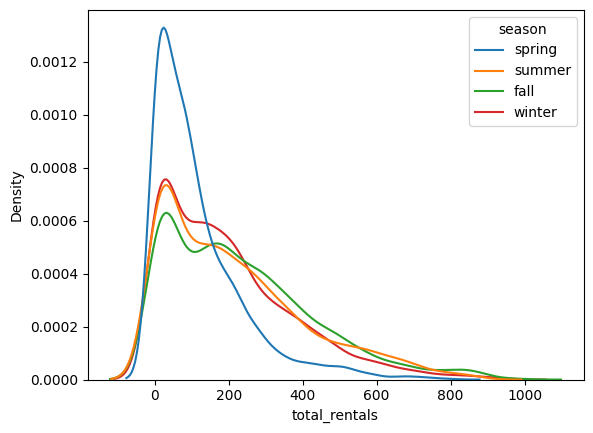

In [ ]:
sns.kdeplot(data=data,x='total_rentals',hue='season')
plt.show()

It seems all the season except season 1 do have similar variance.

#### Statistical Check

In [ ]:
print('H0: Both the variances are equal')
print('H1: Both the variances are not equal')
print("*"*50)
print('Levene test for Total Rentals on different seasons')
print("*"*50)
test_statistic, p_value = levene(season1['total_rentals'],season2['total_rentals'],season3['total_rentals'])
print(f"The test-statistic for workingday and total_rentals is {test_statistic} with p_value {p_value}")
if(p_value < 0.05):
  print("Hence at morethan 95% confidence level, we reject null hypothesis")
  print("Hence we can say that both the variances are not equal")
  print("Hence we can say that Total Rentals on different seasons are not normally distributed population")
else:
  print("Hence at lessthan 95% confidence level, we fail to reject null hypothesis")
  print("Hence we can say that both the variances are equal")
  print("Hence we can say that Total Rentals on different seasons are normally distributed population")


H0: Both the variances are equal
H1: Both the variances are not equal
**************************************************
Levene test for Total Rentals on different seasons
**************************************************
The test-statistic for workingday and total_rentals is 16.148400220184023 with p_value 1.0014260887689101e-07
Hence at morethan 95% confidence level, we reject null hypothesis
Hence we can say that both the variances are not equal
Hence we can say that Total Rentals on different seasons are not normally distributed population


* **Hence the p_values is smaller than the significance level, Null hypothesis can be rejected.**

* **Therefore, the variances are not equal.**

* **Two of the three conditions of ANOVA are not met, We will still perform ANOVA.**

* **Then We will also perform Kruskal's test and compare the results.**

* **In case of any discrepancies, Kruskal's test results will be considered, since data does not met conditions of ANOVA.**

### One-Way Anova

In [ ]:
from scipy.stats import f_oneway

In [ ]:
print("-"*100)
print("Ho: There is no significant difference between demand of bicycles for different seasons.")
print("Ha: There is a significant difference between demand of bicycles for different seasons.")
print("*"*50)
print("One-way Anova Test on demand of electric bicycles on different weather conditions")
print("*"*50)
f_stat,p_value = f_oneway(season1['total_rentals'],season2['total_rentals'],season3['total_rentals'],season4['total_rentals'])
print(f"The f-statistic for different seasons and total_rentals is {test_statistic} with p_value {p_value}")
if(p_value < 0.05):
  print("Hence at morethan 95% confidence level, we reject null hypothesis")
  print("Hence it is significant enough to say there is a significant difference between demand of bicycles for different seasons.")
else:
  print("Hence at lessthan 95% confidence level, we fail to reject null hypothesis")
  print("Hence we can say that there is no significant difference between demand of bicycles for different seasons.")
print("-"*100)

----------------------------------------------------------------------------------------------------
Ho: There is no significant difference between demand of bicycles for different seasons.
Ha: There is a significant difference between demand of bicycles for different seasons.
**************************************************
One-way Anova Test on demand of electric bicycles on different weather conditions
**************************************************
The f-statistic for different seasons and total_rentals is 16.148400220184023 with p_value 6.164843386499654e-149
Hence at morethan 95% confidence level, we reject null hypothesis
Hence it is significant enough to say there is a significant difference between demand of bicycles for different seasons.
----------------------------------------------------------------------------------------------------


### kruskalWallis test

In [ ]:
from scipy.stats import kruskal

In [ ]:
print("-"*100)
print("H0: All the medians of total rents are same in different seasons")
print("H0: All the medians of total rents are different in different seasons")
print("*"*50)
print("Kruskal-Wallis Test on demand of electric bicycles on different seasons conditions")
print("*"*50)
test_stat,p_value = kruskal(season1['total_rentals'],season2['total_rentals'],season3['total_rentals'],season4['total_rentals'])
print(f"The test-statistic for different seasons and total_rentals is {test_statistic} with p_value {p_value}")
if(p_value < 0.05):
  print("Hence at morethan 95% confidence level, we reject null hypothesis")
  print("Hence it is significant enough to say there is a significant difference between demand of bicycles for different seasons.")
else:
  print("Hence at lessthan 95% confidence level, we fail to reject null hypothesis")
  print("Hence we can say that there is no significant difference between demand of bicycles for different seasons.")
print("-"*100)

----------------------------------------------------------------------------------------------------
H0: All the medians of total rents are same in different seasons
H0: All the medians of total rents are different in different seasons
**************************************************
Kruskal-Wallis Test on demand of electric bicycles on different seasons conditions
**************************************************
The test-statistic for different seasons and total_rentals is 16.148400220184023 with p_value 2.4790083726176776e-151
Hence at morethan 95% confidence level, we reject null hypothesis
Hence it is significant enough to say there is a significant difference between demand of bicycles for different seasons.
----------------------------------------------------------------------------------------------------


**Therefore, It clearly says that different seasons attract the customers in a different demand for rentals.**

## *ANOVA to check if No. of cycles rented is similar or different in both different weather and season*

In [ ]:
data[['weather','season']].value_counts()

weather        season
clear          fall      1930
               summer    1801
               spring    1759
               winter    1702
partly_cloudy  winter     807
               spring     715
               summer     708
               fall       604
rain           winter     225
               summer     224
               spring     211
               fall       199
heavy rain     spring       1
Name: count, dtype: int64

As there are 2 independent categories with morethan 2 categories each, using Two-way Anova is the best way.

**Working Nature of Two-Way Anova:**

1. Main Effect: Each category on the numerical.
2. Interaction Effect: Interaction between categories with respect to numerical.

Since, effect of total_rentals is observed for both weather and seasons seperately. we don't need to re-check on Main Effect.

In [ ]:
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

**Assumptions of Two-Way Anova**
* H0: There is an interaction effect between Weather and season on Total Rentals.
* H1: There is no effects of combination of Weather and season on Total Rentals.

In [ ]:
df = ols('total_rentals ~ C(weather) * C(season)',data=data).fit()
anova_lm(df,type=2)

,df,sum_sq,mean_sq,F,PR(>F)
C(weather),3.0,6.338070e+06,2.112690e+06,69.887591,9.254158e-45
C(season),3.0,2.158708e+07,7.195692e+06,238.032851,1.350921e-149
C(weather):C(season),9.0,5.716762e+05,6.351957e+04,2.101222,2.605103e-02
Residual,10873.0,3.286889e+08,3.022983e+04,NaN,NaN


In [ ]:
p_value=2.605103e-02
print(f"The p_value for Two-way Anova interaction effect of Weather and Season on Total Rentals is {p_value}")
if(p_value<0.05):
  print("Hence at morethan 95% confidence level, we reject null hypothesis")
  print("Hence it is significant enough to say there is a significant interaction effect between Weather and season on Total Rentals.")
else:
  print("Hence at lessthan 95% confidence level, we fail to reject null hypothesis")
  print("Hence we can say that there is no significant interaction effect between Weather and season on Total Rentals.")

The p_value for Two-way Anova interaction effect of Weather and Season on Total Rentals is 0.02605103
Hence at morethan 95% confidence level, we reject null hypothesis
Hence it is significant enough to say there is a significant interaction effect between Weather and season on Total Rentals.


**Hence by this we can say that there is a significant interaction effect between Weather and season on Total Rentals.**

## *Chi-square test to check if Weather is dependent on the season*

**Assumptions of Chi-Square Test for Independence**
* Both variables being tested are categorical
* Observations are independent of each other
* The cells in the contingency table are mutually exclusive
* The expected frequency in each cell should be at least 5 (or in most cases, at least 80% of cells should meet this criteria).

In [ ]:
data[['weather','season']].value_counts()

weather        season
clear          fall      1930
               summer    1801
               spring    1759
               winter    1702
partly_cloudy  winter     807
               spring     715
               summer     708
               fall       604
rain           winter     225
               summer     224
               spring     211
               fall       199
heavy rain     spring       1
Name: count, dtype: int64

As there are two independent categroical variables, we can perfom chi-square test for independence.

In [ ]:
# Check if any value from 'weather' exists in 'season'
overlap = data['weather'].isin(data['season'])
# Check if there are any overlaps
if any(overlap):
    print("Columns are not mutually exclusive")
else:
    print("Columns are mutually exclusive")

Columns are mutually exclusive


It satisfies all the conditions of chi-square test.

In [ ]:
from scipy.stats import chi2_contingency

In [ ]:
data_crosstab = pd.crosstab(data['weather'],data['season'], margins = False)
data_crosstab

season,spring,summer,fall,winter
weather,,,,
clear,1759,1801,1930,1702
partly_cloudy,715,708,604,807
rain,211,224,199,225
heavy rain,1,0,0,0


In [ ]:
print("-"*100)
print("H0: Weather and season are independent")
print("H1: Weather and season are dependent")
print("Chi-square test for independence of Weather and season")
print("*"*50)
test_stats,p_value,dof,expect_freq = chi2_contingency(data_crosstab)
print(f"The test-statistic for Weather and season is {test_stats} with p_value {p_value} at DOF of {dof}")
if(p_value<0.05):
  print("Hence at morethan 95% confidence level, we reject null hypothesis")
  print("Hence it is significant enough to say Weather and season are dependent.")
else:
  print("Hence at lessthan 95% confidence level, we fail to reject null hypothesis")
  print("Hence we can say that Weather and season are independent.")
print("-"*100)

----------------------------------------------------------------------------------------------------
H0: Weather and season are independent
H1: Weather and season are dependent
Chi-square test for independence of Weather and season
**************************************************
The test-statistic for Weather and season is 49.15865559689363 with p_value 1.5499250736864862e-07 at DOF of 9
Hence at morethan 95% confidence level, we reject null hypothesis
Hence it is significant enough to say Weather and season are dependent.
----------------------------------------------------------------------------------------------------


**Hence We can conclude that Weather and Season are dependent on eachother.**

# **Insights and Recommendations**

## Insights

> <span style="color:teal"><strong>Seasonal Patterns</strong></span>
- Maximum bike rentals occur during summer, while the minimum is observed in winter.

> <span style="color:teal"><strong>Conditions Impact</strong></span>
- Clear weather is associated with the highest bike rental counts, whereas rentals sharply decrease in rain, thunderstorm, snow, or fog.
- Humidity, windspeed, temperature and weather are correlated with season and impacts the count of cycles rented.

> <span style="color:teal"><strong>Temperature Influence</strong></span>
- Lower temperatures correspond to lower bike rentals, and demand rises with increasing temperatures.

> <span style="color:teal"><strong>Time-of-Day Trends</strong></span>
- Bike rentals peak during the day, decline through the night, indicating a pattern fluctuation.

> <span style="color:teal"><strong>Holiday and Working Day Dynamics</strong></span>
- Less rentals on holidays and weekends, with a demand increase on non-working days. However, the overall count on working and non-holiday days are similar.

> <span style="color:teal"><strong>User Type Behavior</strong></span>
- Casual riders dominate on weekends, while registered users are more active on working days.

> <span style="color:teal"><strong>Yearly Growth and User Composition</strong></span>
* The hourly rental count shows impressive annual growth from 2011 to 2012.  
* Approximately 19% of users are casual, and 81% are registered.

> <span style="color:teal"><strong>Monthly and Daily Usage Patterns</strong></span>
- Notable seasonal patterns, with peak demand in spring and summer, and a decline in fall and winter.
- January to March sees the lowest rental counts, and a distinctive daily trend shows peak usage during the afternoon.

> <span style="color:teal"><strong>Weather Impact on Usage</strong></span>
- Clear and partly_cloudy weather correlates with higher rental counts, while extreme weather conditions have limited data representation.

> <span style="color:teal"><strong>Correlations</strong></span>
- Temperature and feeling temperature exhibit a strong positive correlation.
- Registered Users and Total_riders exhibit a strong positive correlation as well.
- Limited correlation observed between weather-related factors and bike rental counts.

> <span style="color:teal"><strong>Statistical Significance</strong></span>
- ANOVA tests confirm statistically significant impacts of seasons and weather on bike rentals.
- Working days vs. holidays have limited impact according to a 2-sample t-test.
- ChiSquare confirms that the Weather is dependent on the Seasons.


---

## Recommendations

> <span style="color:skyblue"><strong>Strategic Seasonal Marketing</strong></span>
* Leverage seasonal patterns by implementing targeted marketing during peak seasons (spring and summer).
* Introduce seasonal incentives and exclusive packages to drive higher demand.

> <span style="color:skyblue"><strong>Dynamic Time-based Pricing</strong></span>
* Optimize resource utilization by implementing dynamic time-based pricing.
* Adjust rental rates to encourage bike usage during off-peak hours, enhancing accessibility.

> <span style="color:skyblue"><strong>Enhanced Weather Data Collection</strong></span>
* Collect more data on extreme weather conditions to understand user behavior.
* Consider specialized bike models or safety measures for different weather scenarios.

> <span style="color:skyblue"><strong>Weather-sensitive Promotions</strong></span>
* Launch weather-specific promotional campaigns focusing on clear and partly cloudy conditions.
* Introduce weather-based discounts to attract more users during favorable weather.

> <span style="color:skyblue"><strong>User-Centric Segmentation</strong></span>
* Tailor marketing strategies for registered and casual users.
* Offer loyalty programs and personalized incentives for registered users, highlighting occasional use benefits for casual users.

> <span style="color:skyblue"><strong>Optimized Inventory Management</strong></span>
* Fine-tune inventory levels based on monthly demand patterns.
* Avoid overstocking during low-demand months and ensure sufficient bikes during peak periods.

> <span style="color:skyblue"><strong>Customer Comfort and Convenience</strong></span>
* Provide amenities like umbrellas or rain jackets to enhance customer comfort.
* Elevate the overall biking experience, contributing to positive customer feedback.

> <span style="color:skyblue"><strong>Collaboration with Weather Services</strong></span>
* Partner with weather services for real-time updates in marketing campaigns.
* Showcase ideal biking conditions through app integration, appealing to weather-specific preferences.


> <span style="color:skyblue"><strong>Seasonal Bike Maintenance</strong></span>
* Conduct thorough seasonal bike maintenance to prevent breakdowns.
* Ensure optimal bike performance, enhancing customer satisfaction.

> <span style="color:skyblue"><strong>Customer Feedback and Reviews</strong></span>
* Encourage customer feedback to identify areas for improvement.
* Customize services based on insights, exceeding customer expectations.

> <span style="color:skyblue"><strong>Strategic Social Media Marketings</strong></span>
* Utilize social media platforms for strategic promotions and engagement.
* Share diverse biking experiences, customer testimonials, and run targeted advertising campaigns.

**These recommendations aim to maximize `Yulu`'s market reach, optimize operations, and enhance the overall customer experience. Implementing these strategies will position Yulu as a customer-centric and environmentally-conscious brand in the electric bike rental industry.**

In [ ]:
print("*"*100,"Thank You","*"*100)

**************************************************************************************************** Thank You ****************************************************************************************************
